## Model output data analysis.

This notebook contains the main methods used to analyse the output of the models used in the project on the analysis of the dimensionality of control of the VL and GM muscles.

1. It calculates the ability of the different models to reconstruct individual motor unit firing rates.

2. It shows the mean performance over a population as a function of models, subjects and conditions in a heatmap.

3. It tests the statistical significance of the above.

4. It checks whether there is an effect on the reconstructability across conditions for matched motor units (see next block for explanation)

5. It checks the stability of the performance across trials at a motor unit level.

6. It checks the effect of the recruitment threshold on the ability of certain models to reconstruct certain motor units better.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
import math
from prettytable  import PrettyTable

In [ ]:
path = "/content/drive/MyDrive/Computational Neuroscience/UNice Courses/MU_clustering/"

Mounted at /content/drive


In [ ]:
# Load model evaluated results
lin = np.load(path+'Model_Outputs/l1.npy', allow_pickle=True)
lin2 = np.load(path+'Model_Outputs/l2.npy', allow_pickle=True)
lin3 = np.load(path+'Model_Outputs/l3.npy', allow_pickle=True)
nlin = np.load(path+'Model_Outputs/nl.npy', allow_pickle=True)

In [ ]:
# Load matched motor unit tables
S1_VL = pd.read_csv(path+'Matched_MUs/S1_VL_Matched_MUs.csv')
S2_VL = pd.read_csv(path+'Matched_MUs/S2_VL_Matched_MUs.csv')
S3_VL = pd.read_csv(path+'Matched_MUs/S3_VL_Matched_MUs.csv')
S4_VL = pd.read_csv(path+'Matched_MUs/S4_VL_Matched_MUs.csv')
S5_VL = pd.read_csv(path+'Matched_MUs/S5_VL_Matched_MUs.csv')
S6_VL = pd.read_csv(path+'Matched_MUs/S6_VL_Matched_MUs.csv')
S1_GM = pd.read_csv(path+'Matched_MUs/S1_GM_Matched_MUs.csv')
S2_GM = pd.read_csv(path+'Matched_MUs/S2_GM_Matched_MUs.csv')
S3_GM = pd.read_csv(path+'Matched_MUs/S3_GM_Matched_MUs.csv')
S4_GM = pd.read_csv(path+'Matched_MUs/S4_GM_Matched_MUs.csv')
S6_GM = pd.read_csv(path+'Matched_MUs/S6_GM_Matched_MUs.csv')
S7_GM = pd.read_csv(path+'Matched_MUs/S7_GM_Matched_MUs.csv')
VL = [S1_VL, S2_VL, S3_VL, S4_VL, S5_VL, S6_VL, S1_GM, S2_GM, S3_GM, S4_GM, S6_GM, S7_GM]

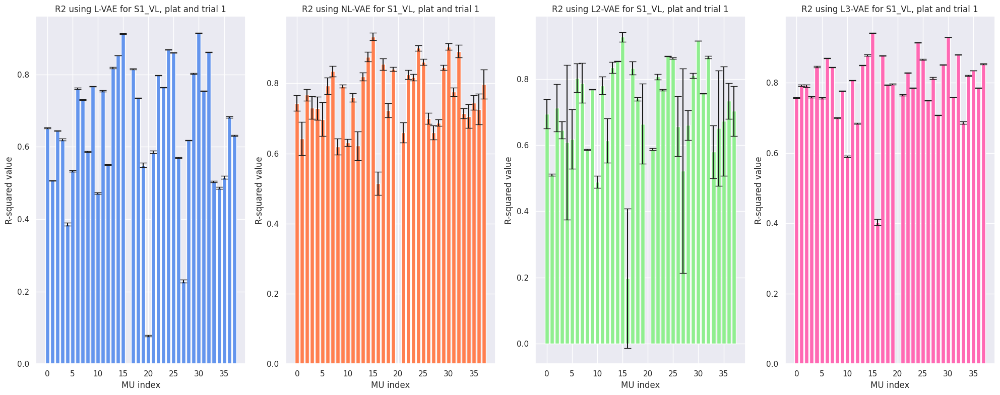

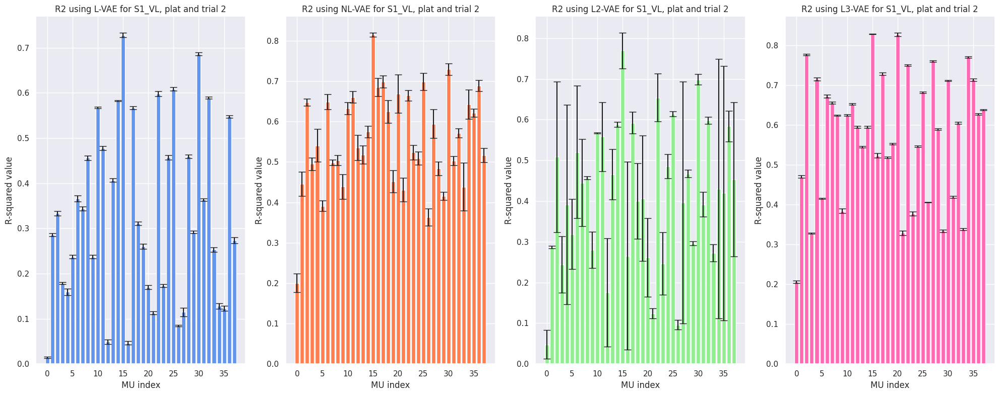

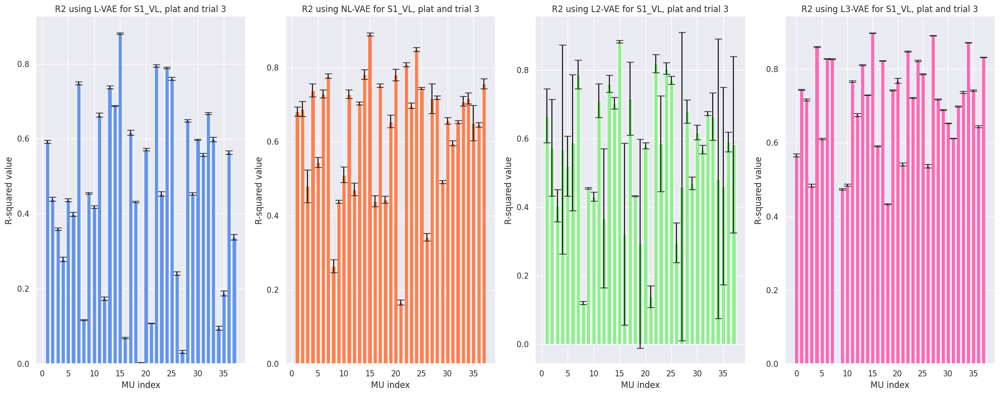

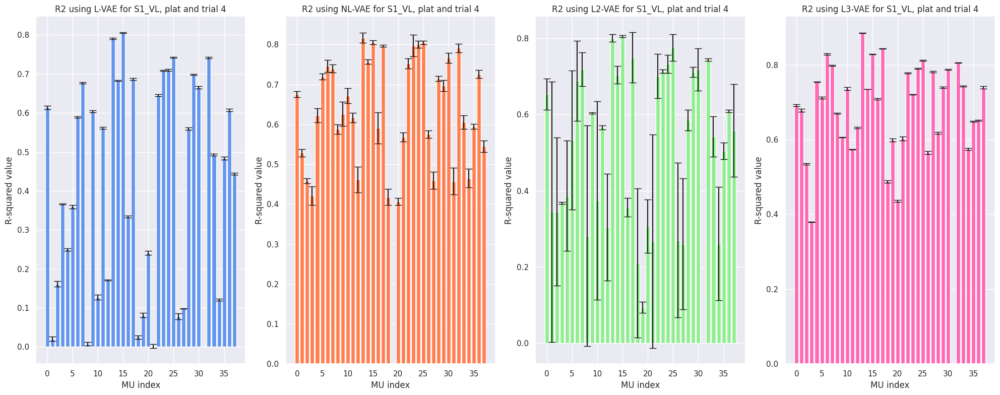

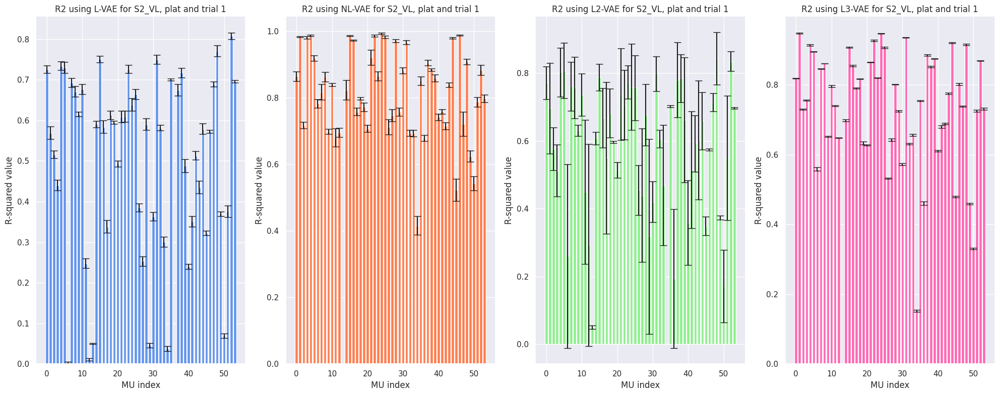

...

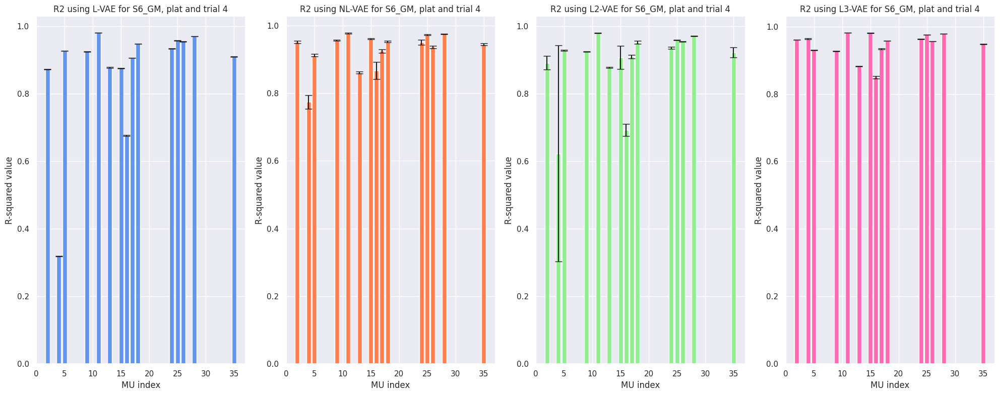

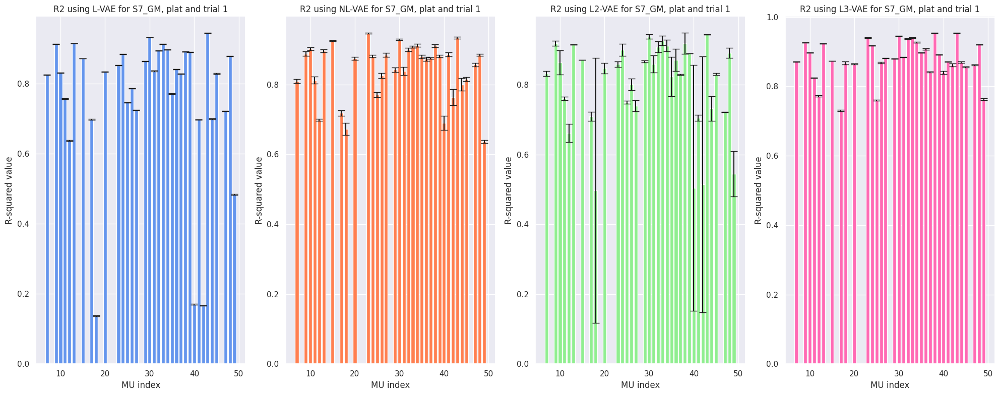

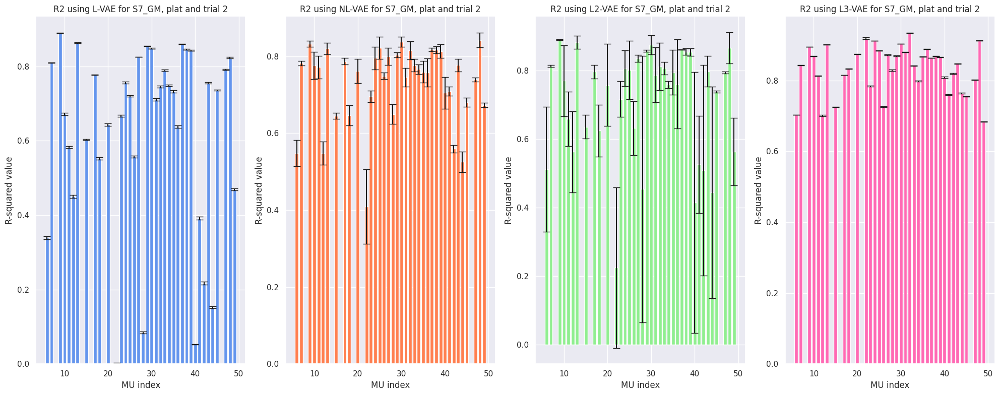

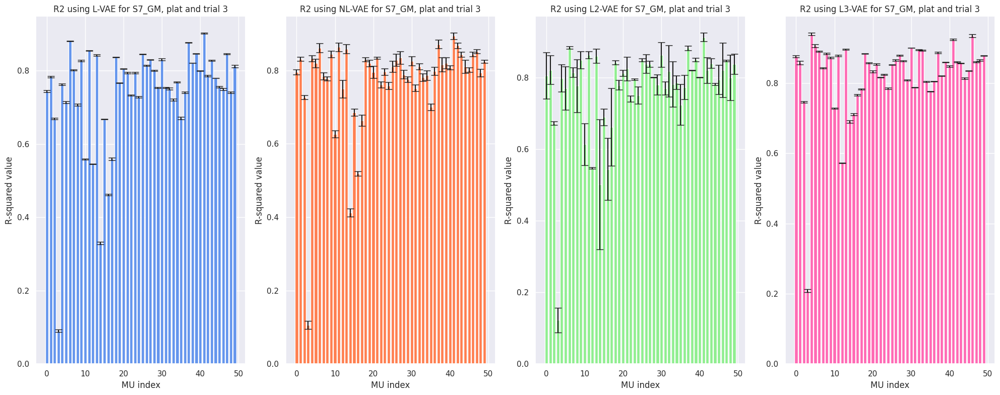

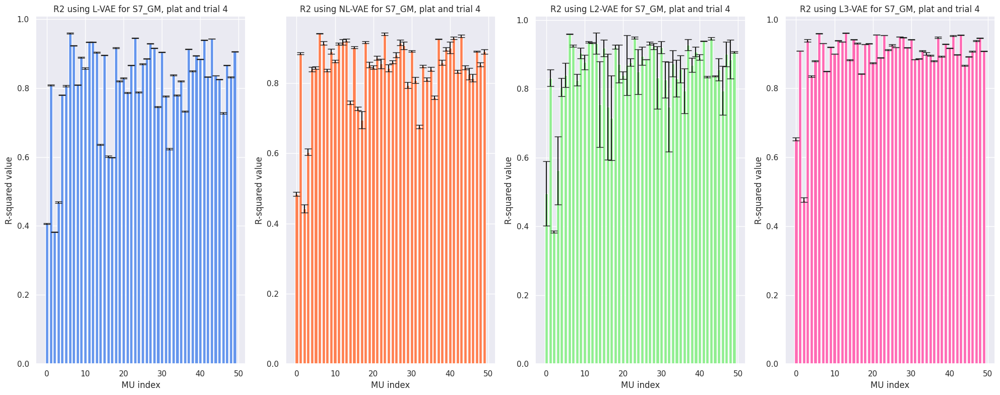

In [ ]:
# Start by showing regular performance of the individual motor units
subjects = ["S1_VL", "S2_VL", "S3_VL", "S4_VL", "S5_VL", "S6_VL", "S1_GM", "S2_GM", "S3_GM", "S4_GM", "S6_GM", "S7_GM"]
conditions = ["plat", "sin025", "sin1", "sin3"]

sns.set(font_scale=1)

r2_l = []
r2_nl = []
r2_l2 = []
r2_l3 = []
for i in range(len(subjects)):
    r2_sub_l = []
    r2_sub_nl = []
    r2_sub_l2 = []
    r2_sub_l3 = []
    for j in range(len(conditions)):
        # Plot simulated MUs, reconstructed MUs and common drive together
        r2_l_trial = []
        r2_nl_trial = []
        r2_l2_trial = []
        r2_l3_trial = []

        if conditions[j] == 'plat':
          n_trials = 4
        else:
          n_trials = 3

        if j > len(lin[i])-1:
            r2_sub_l.append([0] * n_trials)
            r2_sub_nl.append([0] * n_trials)
            r2_sub_l2.append([0] * n_trials)
            r2_sub_l3.append([0] * n_trials)
            continue

        for k in range(n_trials):
            # Limit to single condition
            if j > 0:
              continue

            # Extract names, mean scores, and standard deviations from each result list
            _, means1, _ = zip(*lin[i][j][k])

            # Remove motor units from trials where they weren't active
            ind_below_zero_l = [index for index, value in enumerate(means1) if value < 0] # Get indices of values below 0

            # Remove inactive motor units from all models
            lin_2 = [value for index, value in enumerate(lin[i][j][k]) if index not in ind_below_zero_l]
            nlin_2 = [value for index, value in enumerate(nlin[i][j][k]) if index not in ind_below_zero_l]
            lin2_2 = [value for index, value in enumerate(lin2[i][j][k]) if index not in ind_below_zero_l]
            lin3_2 = [value for index, value in enumerate(lin3[i][j][k]) if index not in ind_below_zero_l]

            names1, means1, std_devs1 = zip(*lin_2)#[i][j][k])
            names2, means2, std_devs2 = zip(*nlin_2)#[i][j][k])
            names3, means3, std_devs3 = zip(*lin2_2)#[i][j][k])
            names4, means4, std_devs4 = zip(*lin3_2)#[i][j][k])

            # Add means/r2 scores to matrix
            r2_l_trial.append(np.mean(means1))
            r2_nl_trial.append(np.mean(means2))
            r2_l2_trial.append(np.mean(means3))
            r2_l3_trial.append(np.mean(means4))

            # Create bar charts for each result list
            plt.figure(figsize=(20, 8))

            plt.subplot(1, 4, 1)
            plt.bar(names1, means1, yerr=std_devs1, capsize=5, color='cornflowerblue')
            plt.title(f'R2 using L-VAE for {subjects[i]}, {conditions[j]} and trial {k+1}')
            plt.xlabel('MU index')
            plt.ylabel('R-squared value')

            plt.subplot(1, 4, 2)
            plt.bar(names2, means2, yerr=std_devs2, capsize=5, color='coral')
            plt.title(f'R2 using NL-VAE for {subjects[i]}, {conditions[j]} and trial {k+1}')
            plt.xlabel('MU index')
            plt.ylabel('R-squared value')

            plt.subplot(1, 4, 3)
            plt.bar(names3, means3, yerr=std_devs3, capsize=5, color='lightgreen')
            plt.title(f'R2 using L2-VAE for {subjects[i]}, {conditions[j]} and trial {k+1}')
            plt.xlabel('MU index')
            plt.ylabel('R-squared value')

            plt.subplot(1, 4, 4)
            plt.bar(names4, means4, yerr=std_devs4, capsize=5, color='hotpink')
            plt.title(f'R2 using L3-VAE for {subjects[i]}, {conditions[j]} and trial {k+1}')
            plt.xlabel('MU index')
            plt.ylabel('R-squared value')

            # Show the plots
            plt.tight_layout()
            plt.show()

        r2_sub_l.append(r2_l_trial)
        r2_sub_nl.append(r2_nl_trial)
        r2_sub_l2.append(r2_l2_trial)
        r2_sub_l3.append(r2_l3_trial)
    r2_l.append(r2_sub_l)
    r2_nl.append(r2_sub_nl)
    r2_l2.append(r2_sub_l2)
    r2_l3.append(r2_sub_l3)

In [ ]:
# Plot the heatmaps of the r2 score
for i in range(1): #len(conditions)):
  # Trial labels
  x_labels_trials = ["Trial 1", "Trial 2", "Trial 3", "Trial 4"]

  # Check num available
  if conditions[i] == 'plat':
    n_trials = 4
  else:
    n_trials = 3

  x_labels_trials = x_labels_trials[:n_trials]

  # Create a heatmap
  plt.figure(figsize=(20, 50))  # Adjust the figure size as needed

  r2_l_np = [r2_l[subject][i] for subject in range(len(r2_l))]

  # Customize the heatmap appearance
  plt.subplot(4, 1, 1)
  sns.set(font_scale=2)  # Adjust the font size
  ax = sns.heatmap(r2_l_np, annot=True, cmap='coolwarm', cbar=True, square=True,
              xticklabels=x_labels_trials, yticklabels=subjects, fmt='.2f', vmin=0, vmax=1)

  # Move column labels to the top
  ax.xaxis.set_ticks_position('top')
  # ax.set_xlabel('Trials', labelpad=-380)

  # Add labels and title
  plt.ylabel('Subjects')
  plt.title(f'Mean R-squared score per subject and trial L-VAE')

  r2_l2_np = [r2_l2[subject][i] for subject in range(len(r2_l2))]

  # Customize the heatmap appearance
  plt.subplot(4, 1, 2)
  sns.set(font_scale=2)  # Adjust the font size
  ax = sns.heatmap(r2_l2_np, annot=True, cmap='coolwarm', cbar=True, square=True,
              xticklabels=x_labels_trials, yticklabels=subjects, fmt='.2f', vmin=0, vmax=1)

  # Move column labels to the top
  ax.xaxis.set_ticks_position('top')
  #ax.set_xlabel('Trials', labelpad=-380)

  # Add labels and title
  plt.ylabel('Subjects')
  plt.title(f'Mean R-squared score per subject and trial L-VAE 2 latents')

  r2_l3_np = [r2_l3[subject][i] for subject in range(len(r2_l3))]

  # Customize the heatmap appearance
  plt.subplot(4, 1, 3)
  sns.set(font_scale=2)  # Adjust the font size
  ax = sns.heatmap(r2_l3_np, annot=True, cmap='coolwarm', cbar=True, square=True,
              xticklabels=x_labels_trials, yticklabels=subjects, fmt='.2f', vmin=0, vmax=1)

  # Move column labels to the top
  ax.xaxis.set_ticks_position('top')
  #ax.set_xlabel('Trials', labelpad=-380)

  # Add labels and title
  plt.ylabel('Subjects')
  plt.title(f'Mean R-squared score per subject and trial L-VAE 3 latents')

  r2_nl_np = [r2_nl[subject][i] for subject in range(len(r2_nl))]

  # Customize the heatmap appearance
  plt.subplot(4, 1, 4)
  sns.set(font_scale=2)  # Adjust the font size
  ax = sns.heatmap(r2_nl_np, annot=True, cmap='coolwarm', cbar=True, square=True,
              xticklabels=x_labels_trials, yticklabels=subjects, fmt='.2f', vmin=0, vmax=1)

  # Move column labels to the top
  ax.xaxis.set_ticks_position('top')
  #ax.set_xlabel('Trials', labelpad=-380)

  # Add labels and title
  plt.ylabel('Subjects')
  plt.title(f'Mean R-squared score per subject and trial NL-VAE')

  # Show the heatmap
  plt.tight_layout()
  plt.show()


### Statistics
Before we continue to check the matched behaviour of the motor units across models. We first need to know if the above results are signficant. We will perform several statistical tests to confirm this.
- First of all we want to generalise this to the muscle level. Show box and whisker plots for every model between the two muscles and calculate significance between the two muscles in each case.
- Second, we want to calculate a confidence interval per trial for both muscles. Per model. Show that there is more difference between VL amongst different models than GM with different models.
- Then we want to see if there is a significance between trials for every subject.
- We also want to see if there is a significance relation between the subjects within a trial.

In [ ]:
# Stats imports
from scipy.stats import mannwhitneyu
from scipy.stats import f_oneway
from scipy.stats import ttest_1samp

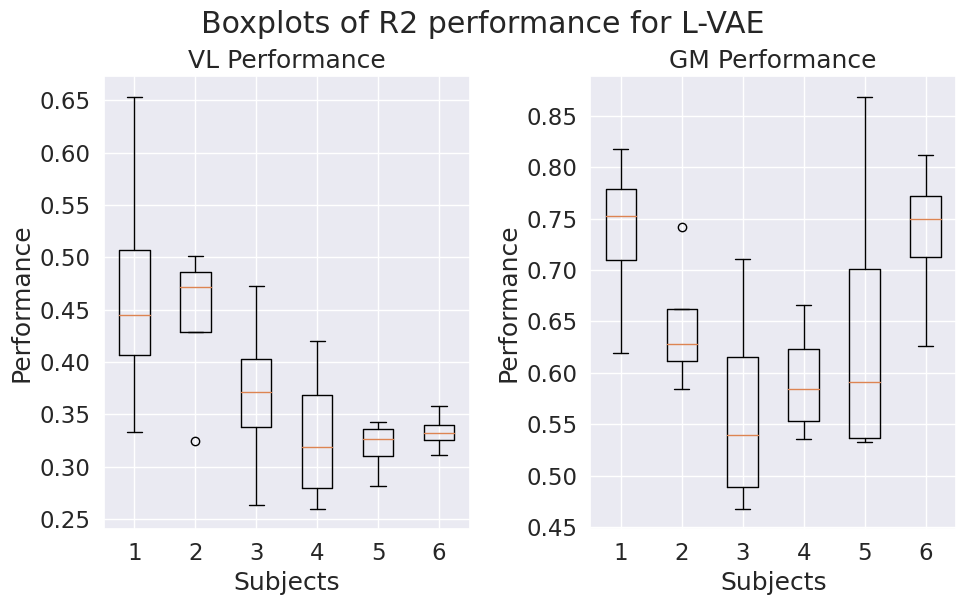

Mann-Whitney U Statistic: 18.0
p-value: 2.7445651191271863e-08
There is a significant difference between the two sets for L-VAE.


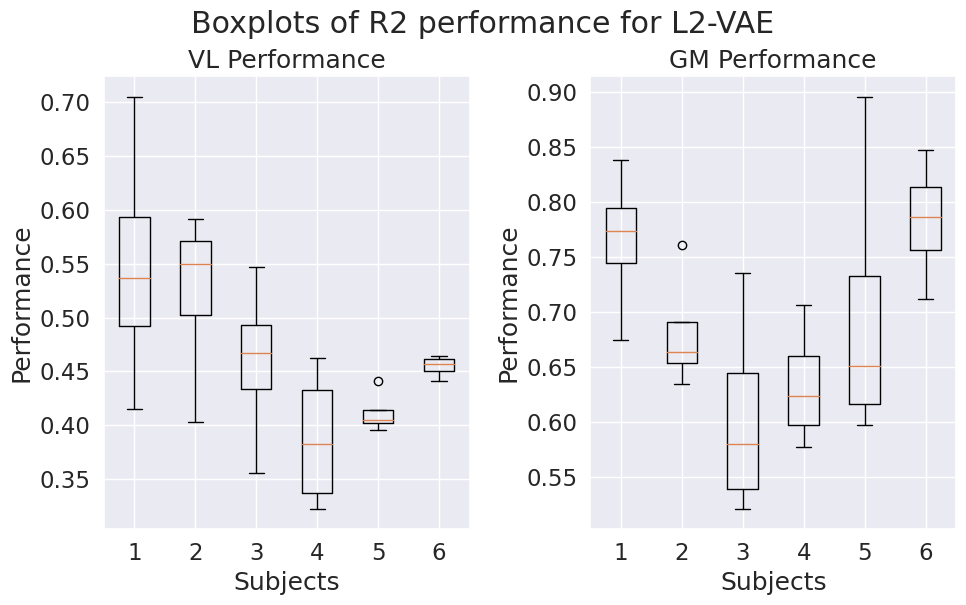

Mann-Whitney U Statistic: 23.0
p-value: 4.9277453010895736e-08
There is a significant difference between the two sets for L2-VAE.


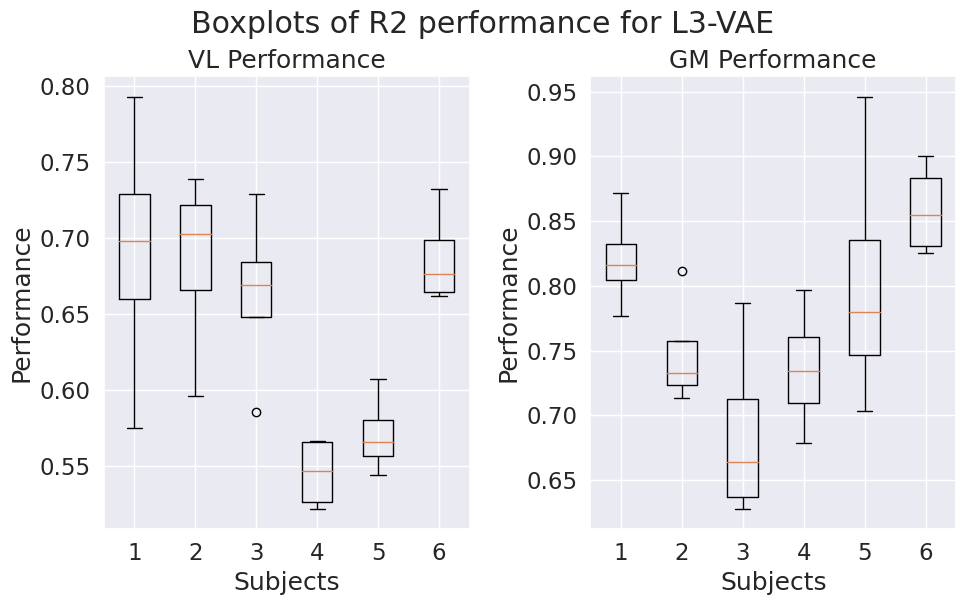

Mann-Whitney U Statistic: 68.0
p-value: 6.010668007730692e-06
There is a significant difference between the two sets for L3-VAE.


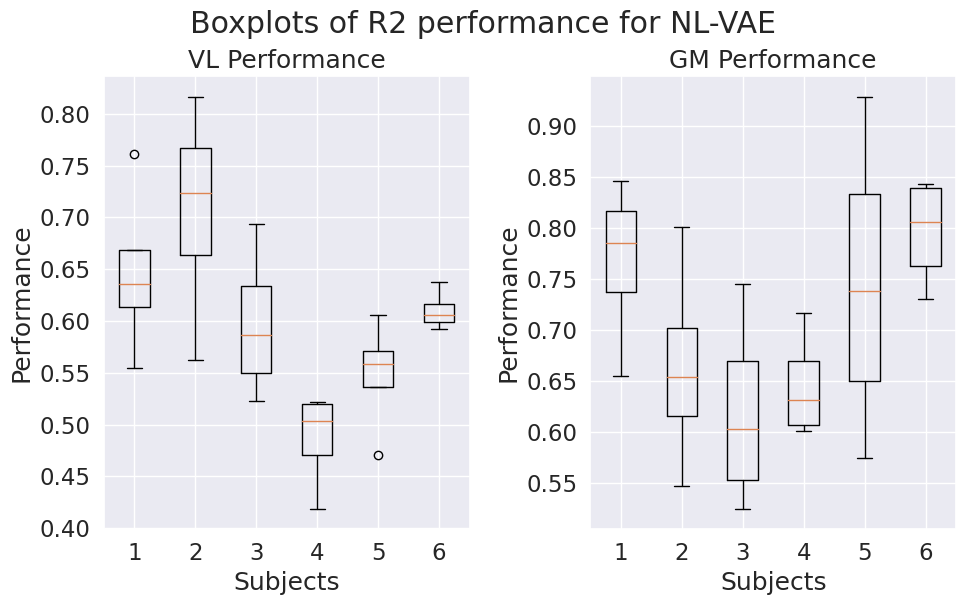

Mann-Whitney U Statistic: 129.0
p-value: 0.0010822814831204174
There is a significant difference between the two sets for NL-VAE.


In [ ]:
# Performance between muscles
# Put r2 results into loopable object
r2_np = [r2_l_np, r2_l2_np, r2_l3_np, r2_nl_np]
titles_r2 = ["L-VAE", "L2-VAE", "L3-VAE", "NL-VAE"]
bonf = 4
sns.set(font_scale=1.5)  # Adjust the font size
for i in range(bonf):
  # Split data
  VL_l = np.array(r2_np[i][:6])
  GM_l = np.array(r2_np[i][6:])

  # Create box and whisker plots for each set
  plt.figure(figsize=(10, 6))

  plt.subplot(1, 2, 1)
  plt.boxplot(VL_l.T)
  plt.title('VL Performance')
  plt.xlabel('Subjects')
  plt.ylabel('Performance')

  plt.subplot(1, 2, 2)
  plt.boxplot(GM_l.T)
  plt.title('GM Performance')
  plt.xlabel('Subjects')
  plt.ylabel('Performance')

  plt.tight_layout()
  plt.suptitle(f"Boxplots of R2 performance for {titles_r2[i]}", y=1.02)
  plt.show()

  # Perform Mann-Whitney U test to compare the two sets
  statistic, p_value = mannwhitneyu(VL_l.flatten(), GM_l.flatten())

  # Print results
  print("Mann-Whitney U Statistic:", statistic)
  print("p-value:", p_value)

  # Check for significance
  alpha = 0.05/bonf
  if p_value < alpha:
      print(f"There is a significant difference between the two sets for {titles_r2[i]}.")
  else:
      print(f"There is no significant difference between the two sets for {titles_r2[i]}.")

In [ ]:
# Second test
# Here we want to see if the difference in results for the VL is significant between the models.
# We do this using a 1 way ANOVA test.
musc = ["VL", "GM"]
for i in range(2):
  muscle_l = np.mean(np.array(r2_l_np[i*6:i*6+6]), axis=1)
  muscle_l2 = np.mean(np.array(r2_l2_np[i*6:i*6+6]), axis=1)
  muscle_l3 = np.mean(np.array(r2_l3_np[i*6:i*6+6]), axis=1)
  muscle_nl = np.mean(np.array(r2_nl_np[i*6:i*6+6]), axis=1)

  # Simply perform ANOVA on the VL and GM populations
  f_statistic, p_value = f_oneway(muscle_l.flatten(), muscle_l2.flatten(), muscle_l3.flatten(), muscle_nl.flatten())

  # Print results
  print("F-statistic:", f_statistic)
  print("p-value:", p_value)

  # Check for significance
  alpha = 0.05/2
  if p_value < alpha:
      print(f"There is a significant difference between at least one pair of means in the {musc[i]}. \n")
  else:
      print(f"There is no significant difference between the means of the models for {musc[i]}. \n")

F-statistic: 19.6901008153238
p-value: 3.4802081031985526e-06
There is a significant difference between at least one pair of means in the VL. 

F-statistic: 3.1857231319297497
p-value: 0.04607632738893807
There is no significant difference between the means of the models for GM. 



In [ ]:
# Third test
# We want to see if the subjects across trials behave similarly within a muscle.
# We also do this one using repeated measures 1 way ANOVA for every model.

for i in range(2):
  muscle_l = np.array(r2_l_np[i*6:i*6+6])
  muscle_l2 = np.array(r2_l2_np[i*6:i*6+6])
  muscle_l3 = np.array(r2_l3_np[i*6:i*6+6])
  muscle_nl = np.array(r2_nl_np[i*6:i*6+6])

  models = [muscle_l, muscle_l2, muscle_l3, muscle_nl]

  cnt = 0
  for results in models:
    # Simply perform ANOVA on the VL and GM populations
    f_statistic, p_value = f_oneway(*results)

    # Print results
    print("F-statistic:", f_statistic)
    print("p-value:", p_value)

    # Check for significance
    alpha = 0.05/8
    if p_value < alpha:
        print(f"There is a significant difference between at least one pair of subjects in the {musc[i]}, for model {titles_r2[cnt]}. \n")
    else:
        print(f"There is no significant difference between the means of the subjects for {musc[i]}, for model {titles_r2[cnt]}. \n")

    cnt += 1

F-statistic: 2.5573554957071396
p-value: 0.06451640593251758
There is no significant difference between the means of the subjects for VL, for model L-VAE. 

F-statistic: 2.8589960217305332
p-value: 0.04521935657610565
There is no significant difference between the means of the subjects for VL, for model L2-VAE. 

F-statistic: 5.697174580214615
p-value: 0.002541169394899028
There is a significant difference between at least one pair of subjects in the VL, for model L3-VAE. 

F-statistic: 4.6043282151059515
p-value: 0.007012582283523813
There is no significant difference between the means of the subjects for VL, for model NL-VAE. 

F-statistic: 2.0910562083272954
p-value: 0.11379945953522479
There is no significant difference between the means of the subjects for GM, for model L-VAE. 

F-statistic: 2.8852303553405956
p-value: 0.043863372417196365
There is no significant difference between the means of the subjects for GM, for model L2-VAE. 

F-statistic: 4.165859577524707
p-value: 0.0108

In [ ]:
# Fourth test
# We want to see if the trials within every subject are significantly similar.
# To this end we can again use the ANOVA but we have to do so on the transposed results of test 3.

for i in range(2):
  muscle_l = np.array(r2_l_np[i*6:i*6+6])
  muscle_l2 = np.array(r2_l2_np[i*6:i*6+6])
  muscle_l3 = np.array(r2_l3_np[i*6:i*6+6])
  muscle_nl = np.array(r2_nl_np[i*6:i*6+6])

  models = [muscle_l, muscle_l2, muscle_l3, muscle_nl]

  cnt = 0
  for results in models:
    # Simply perform ANOVA on the VL and GM populations
    f_statistic, p_value = f_oneway(*results.T)

    # Print results
    print("F-statistic:", f_statistic)
    print("p-value:", p_value)

    # Check for significance
    alpha = 0.05/8
    if p_value < alpha:
        print(f"There is a significant difference between at least one pair of trials in the {musc[i]}, for model {titles_r2[cnt]}. \n")
    else:
        print(f"There is no significant difference between the means of the trials for {musc[i]}, for model {titles_r2[cnt]}. \n")

    cnt += 1

F-statistic: 0.6981559499942652
p-value: 0.5640902162667596
There is no significant difference between the means of the trials for VL, for model L-VAE. 

F-statistic: 0.7111047781072981
p-value: 0.5567321908836764
There is no significant difference between the means of the trials for VL, for model L2-VAE. 

F-statistic: 0.354180492771815
p-value: 0.7866115978503909
There is no significant difference between the means of the trials for VL, for model L3-VAE. 

F-statistic: 0.35181376899022077
p-value: 0.7882815365691231
There is no significant difference between the means of the trials for VL, for model NL-VAE. 

F-statistic: 0.3721284742249498
p-value: 0.773979161211132
There is no significant difference between the means of the trials for GM, for model L-VAE. 

F-statistic: 0.4142905249790959
p-value: 0.7445837177599473
There is no significant difference between the means of the trials for GM, for model L2-VAE. 

F-statistic: 0.46981098099873986
p-value: 0.7066716020165793
There is no 

### Stability matched motor units
Now we want to see if the motor units behave similarly across the different conditions. Get the same performance.

Using matlab and using the grid data we have isolated which indexes of motor units are the same in each condition for every subject. For example mu 1 in plateau subject 1 is the same mu as mu 17 in condition sin1Hz for subject 1.

The matching of the motor units was done by matching the spiking patterns with a certain confidence threshold between conditions.

We can see that the performance of every subject/condition is stable compared to the full data when we just look at the matched motor units. What we are interested in however is whether the same motor units perform well across conditions. Or more importantly, if the same motor units perform poorly across conditions.

In [ ]:
def find_MU_in_ranking(condition, value):
    for tpl in condition:
        if tpl[0]+1 == value and tpl[1] > 0: # +1 because matlab index was 1 higher
            return tpl
    return None  # Return None if value is not found in any tuple

In [ ]:
def filter_subject_matched(ori, matched):
  filtered = []
  # Loop over conditions
  for j in range(len(ori)):
    filtered_con = []
    n_trials = len(ori[j])

    # Loop over trials
    for l in range(n_trials):
      filtered_trial = []

      # Loop over list of MUs to select
      for k in range(matched.shape[0]):
        cur_MU = matched.iloc[k][j] # Matlab index is 1 higher than python
        ind = find_MU_in_ranking(ori[j][l], cur_MU)

        if ind != None:
          filtered_trial.append(ind)
      filtered_con.append(filtered_trial)
    filtered.append(filtered_con)
  return filtered

In [ ]:
lin_filtered = []
lin2_filtered = []
lin3_filtered = []
nlin_filtered = []

# Loop over subjects
for i in range(len(lin)):
  lin_filtered.append(filter_subject_matched(lin[i], VL[i]))
  lin2_filtered.append(filter_subject_matched(lin2[i], VL[i]))
  lin3_filtered.append(filter_subject_matched(lin3[i], VL[i]))
  nlin_filtered.append(filter_subject_matched(nlin[i], VL[i]))

In [ ]:
def calc_stability_model(lin_filtered, VL):
  MU_stability_total = []
  for j in range(len(VL)):
    MU_over_conditions = []

    # Loop over number of matched motor units (for 1 sub)
    for i in range(VL[j].shape[0]):
      # Select corresponding tuple for each condition
      plat_ind = find_MU_in_ranking(lin_filtered[j][0][0], VL[j].iloc[i][0])
      sin025_ind = find_MU_in_ranking(lin_filtered[j][1][0], VL[j].iloc[i][1])
      sin1_ind = find_MU_in_ranking(lin_filtered[j][2][0], VL[j].iloc[i][2])
      if j != 6 and j != 8:
        sin3_ind = find_MU_in_ranking(lin_filtered[j][3][0], VL[j].iloc[i][3])
        out = [plat_ind, sin025_ind, sin1_ind, sin3_ind]
      else:
        out = [plat_ind, sin025_ind, sin1_ind, (None,None,None)]
      MU_over_conditions.append(out)

    MU_stability = []
    for k in range(len(MU_over_conditions)):
      # Get mean values from the matched tuples
      means = [t[1] for t in MU_over_conditions[k] if isinstance(t, tuple) and t[1] is not None]
      # Means can be 1 if the final MU was removed for evenness correction in the model fit
      if len(means) == 1 or not means:
        continue
      mean_total = statistics.mean(means) # Get mean of means
      std_total = statistics.stdev(means) # Get standard deviation of means

      MU_stability.append((k, mean_total, std_total))

    MU_stability_total.append(MU_stability)
  return MU_stability_total

In [ ]:
lin_stable = calc_stability_model(lin_filtered, VL)
lin2_stable = calc_stability_model(lin2_filtered, VL)
nlin_stable = calc_stability_model(nlin_filtered, VL)

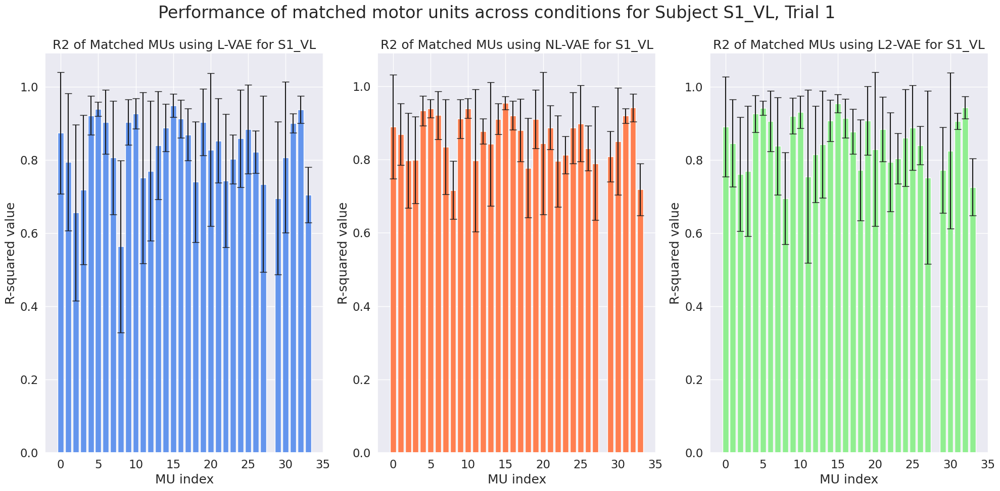

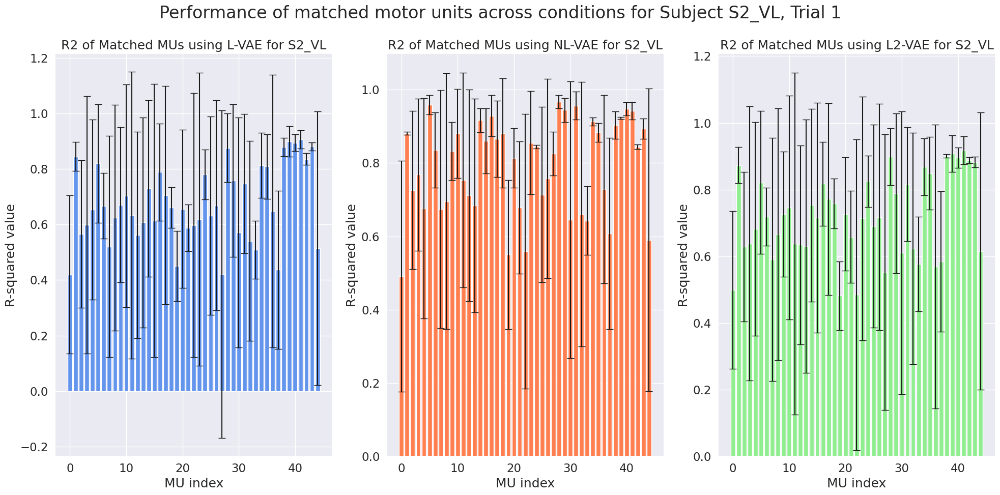

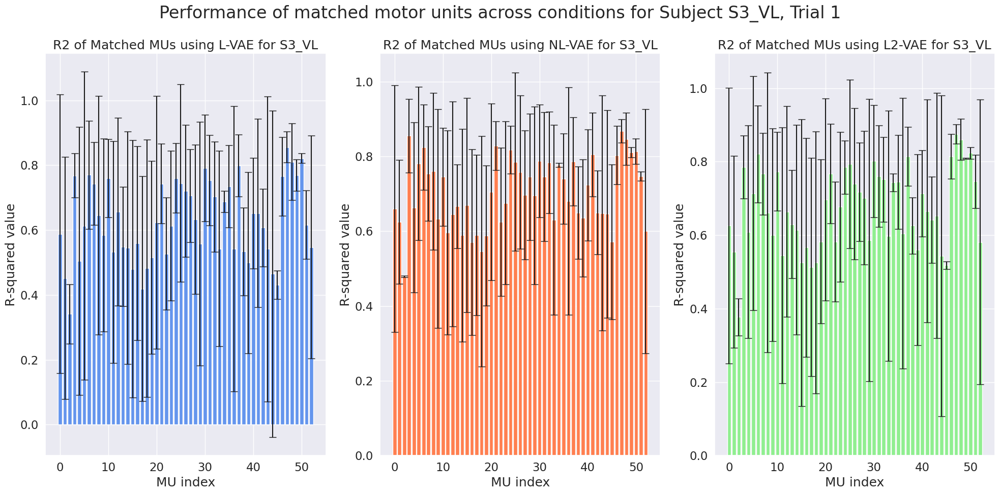

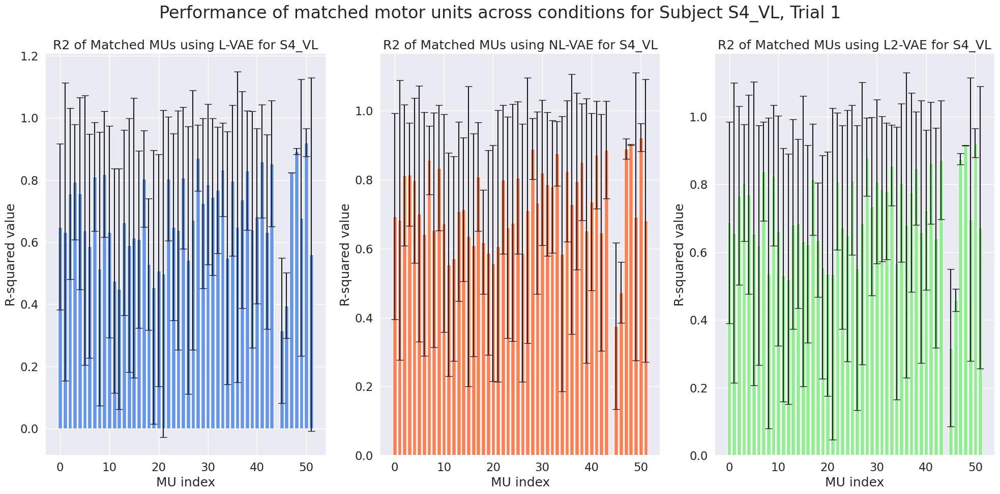

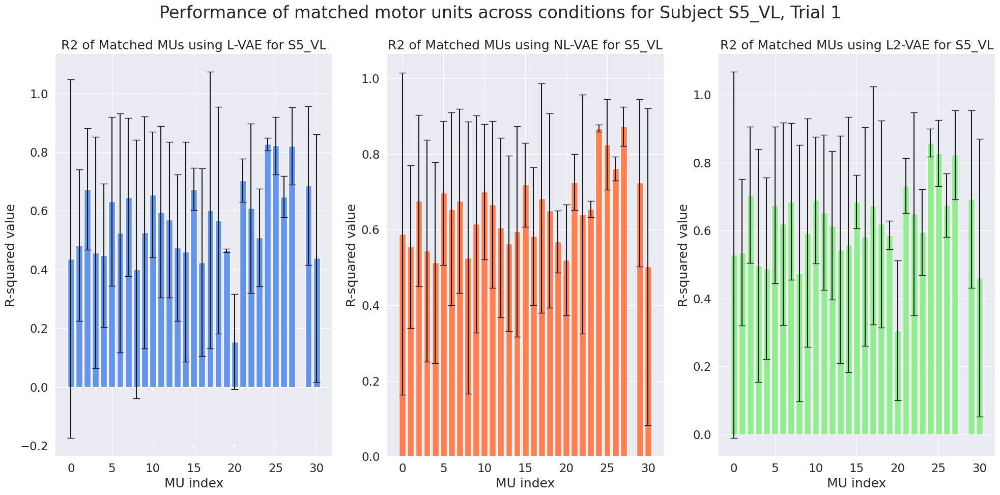

...

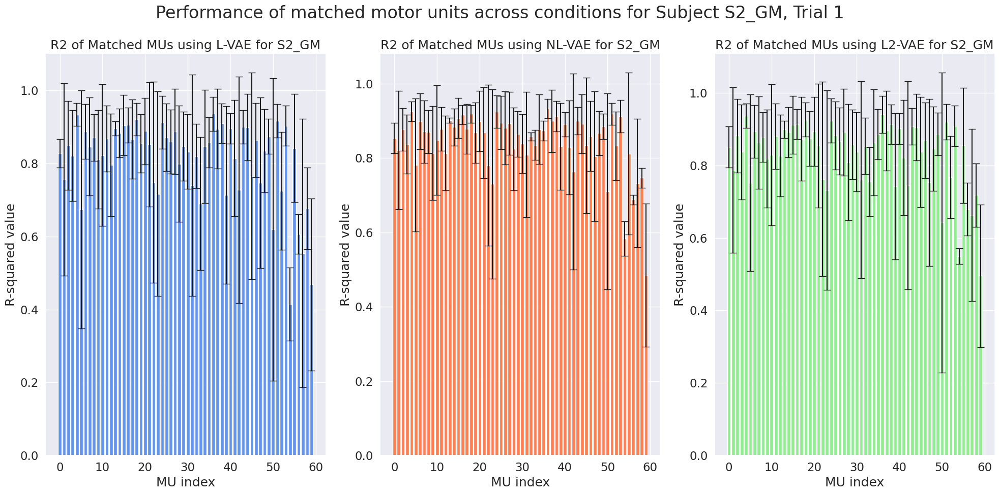

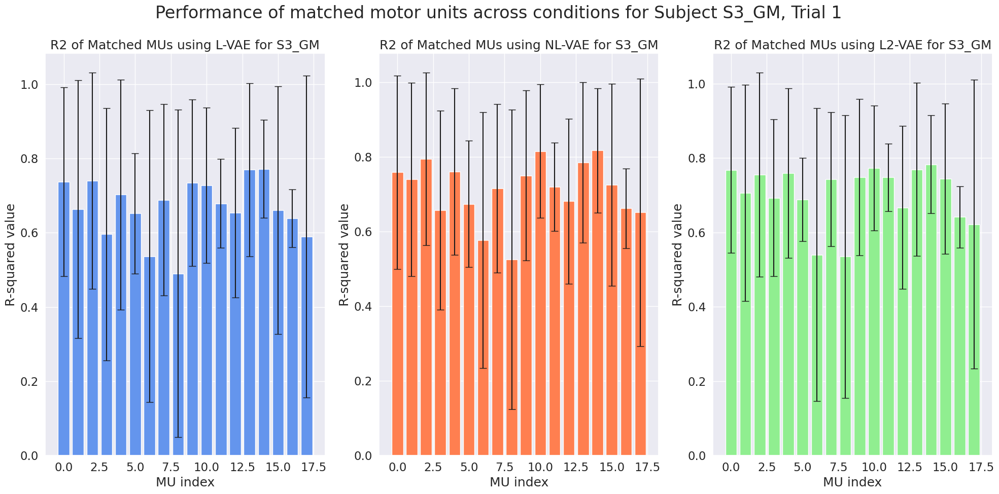

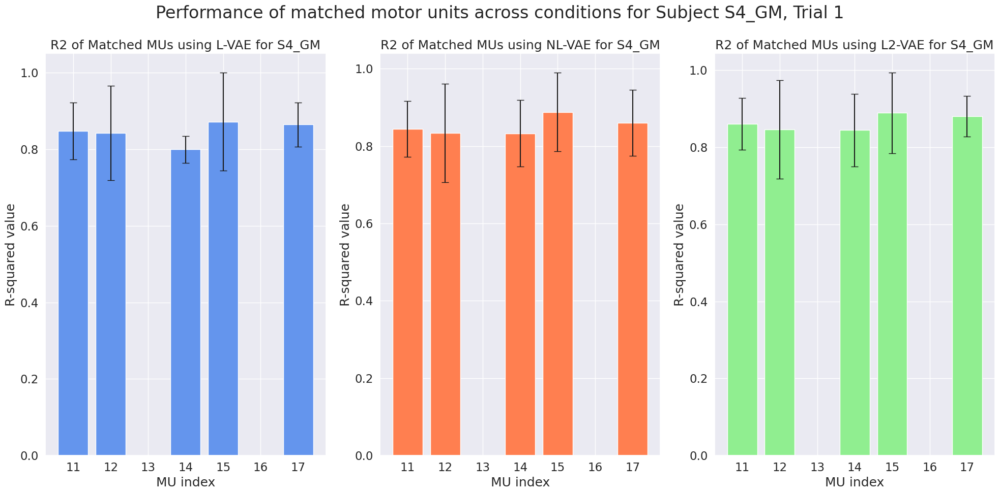

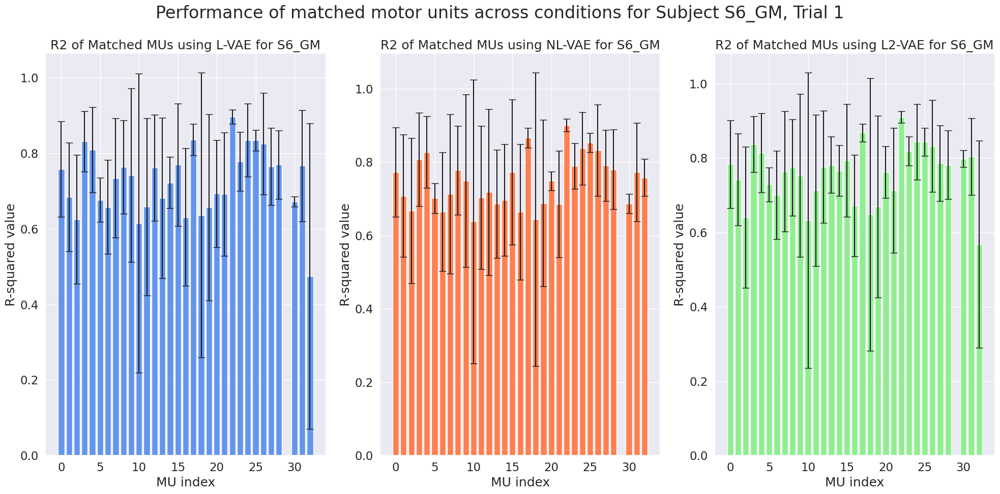

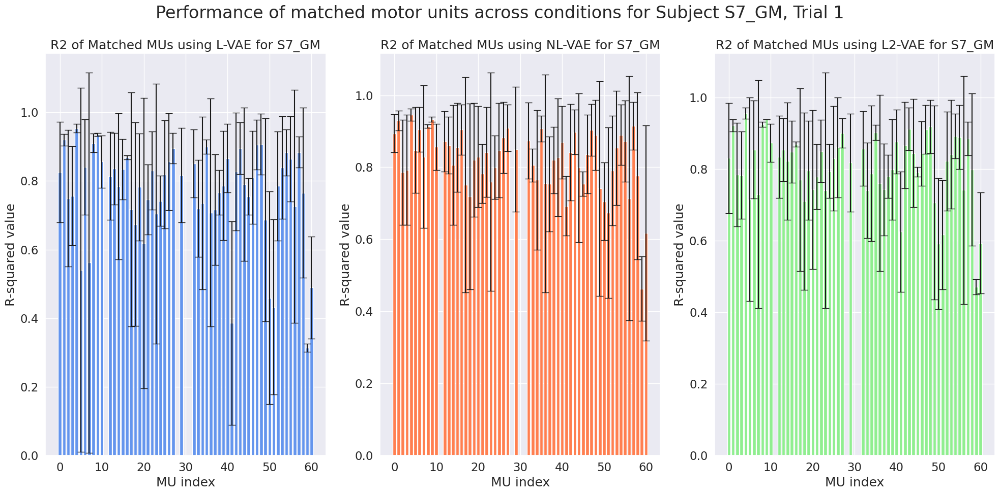

In [ ]:
for i in range(len(subjects)):
  # Extract names, mean scores, and standard deviations from each result list
  names1, means1, std_devs1 = zip(*lin_stable[i])
  names2, means2, std_devs2 = zip(*nlin_stable[i])
  names3, means3, std_devs3 = zip(*lin2_stable[i])

  # Create bar charts for each result list
  plt.figure(figsize=(20, 10))
  sns.set(font_scale=1.5)
  plt.subplot(1, 3, 1)
  plt.bar(names1, means1, yerr=std_devs1, capsize=5, color='cornflowerblue')
  plt.title(f'R2 of Matched MUs using L-VAE for {subjects[i]}')
  plt.xlabel('MU index')
  plt.ylabel('R-squared value')

  plt.subplot(1, 3, 2)
  plt.bar(names2, means2, yerr=std_devs2, capsize=5, color='coral')
  plt.title(f'R2 of Matched MUs using NL-VAE for {subjects[i]}')
  plt.xlabel('MU index')
  plt.ylabel('R-squared value')

  plt.subplot(1, 3, 3)
  plt.bar(names3, means3, yerr=std_devs3, capsize=5, color='lightgreen')
  plt.title(f'R2 of Matched MUs using L2-VAE for {subjects[i]}')
  plt.xlabel('MU index')
  plt.ylabel('R-squared value')

  plt.suptitle(f'Performance of matched motor units across conditions for Subject {subjects[i]}, Trial 1', fontsize=24)

  # Show the plots
  plt.tight_layout()
  plt.show()

### Stability across trials

We want to show if the motor units behave the same across the trials between the different models.

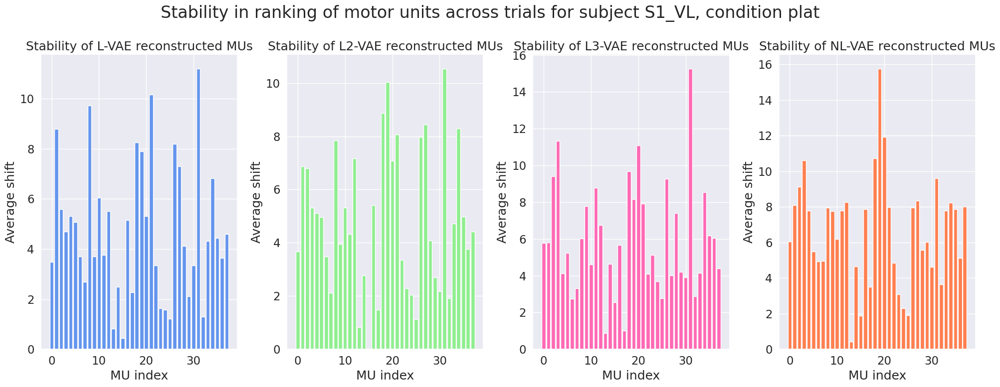


S1_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 15 (0.43)  | 15 (0.00)  | 15 (0.87)  | 15 (0.43)  |  0 (5.72)  |
| 25 (0.83)  | 25 (0.83)  | 26 (1.00)  | 17 (1.87)  | 1 (10.35)  |
| 14 (1.22)  | 37 (1.12)  | 17 (2.55)  |  6 (1.92)  |  2 (6.76)  |
| 17 (1.30)  | 17 (1.48)  | 25 (2.74)  | 25 (2.29)  |  3 (2.06)  |
| 34 (1.58)  | 14 (1.92)  |  7 (2.77)  | 22 (3.08)  |  4 (2.59)  |
| 32 (1.64)  |  6 (2.05)  |  6 (2.87)  | 35 (3.50)  |  5 (6.57)  |
| 27 (2.12)  | 21 (2.12)  |  4 (3.32)  | 21 (3.64)  |  6 (7.04)  |
|  3 (2.28)  | 35 (2.18)  | 21 (3.70)  | 26 (4.61)  |  7 (8.26)  |
| 37 (2.49)  | 12 (2.29)  | 37 (3.90)  |  3 (4.66)  |  8 (7.95)  |
|  5 (2.68)  |  5 (2.69)  | 22 (4.02)  |  4 (4.85)  |  9 (5.72)  |
| 11 (3.34)  | 32 (2.77)  | 36 (4.09)  | 11 (4.92)  | 10 (2.95)  |
| 36 (3.34)  |  4 (3.34)  |  3 (4.12)  |  1 (4.9

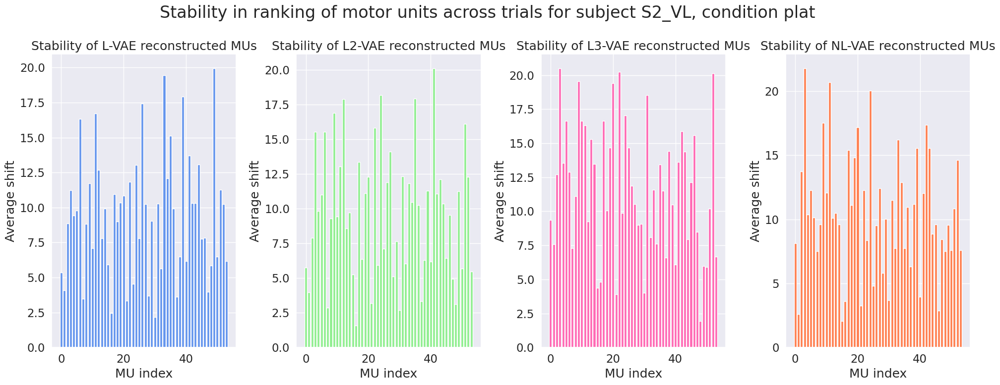


S2_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
|  3 (2.18)  | 37 (1.58)  | 37 (1.92)  | 25 (2.06)  |  0 (1.64)  |
| 10 (2.45)  |  0 (2.69)  |  0 (3.90)  | 23 (2.59)  |  1 (4.97)  |
|  0 (3.34)  | 33 (2.87)  | 43 (4.02)  | 16 (2.87)  |  2 (7.66)  |
| 43 (3.49)  |  3 (3.11)  | 16 (4.39)  |  8 (3.24)  | 3 (19.06)  |
| 51 (3.61)  | 23 (3.20)  | 23 (4.82)  | 37 (3.61)  |  4 (7.58)  |
| 11 (3.70)  | 11 (3.34)  |  8 (5.89)  |  0 (3.70)  |  5 (6.42)  |
| 23 (3.96)  | 43 (3.96)  | 41 (5.97)  | 11 (3.94)  | 6 (12.17)  |
| 37 (4.09)  | 51 (4.95)  | 47 (6.10)  | 33 (4.82)  |  7 (3.91)  |
| 53 (4.56)  | 10 (5.12)  |  7 (6.58)  | 17 (5.80)  |  8 (5.10)  |
|  7 (5.36)  | 39 (5.24)  | 11 (6.65)  | 44 (6.30)  |  9 (6.34)  |
| 38 (5.66)  | 32 (5.48)  |  6 (7.30)  |  6 (7.50)  | 10 (12.50) |
| 17 (5.85)  |  7 (5.67)  | 18 (7.58)  | 26 (7.5

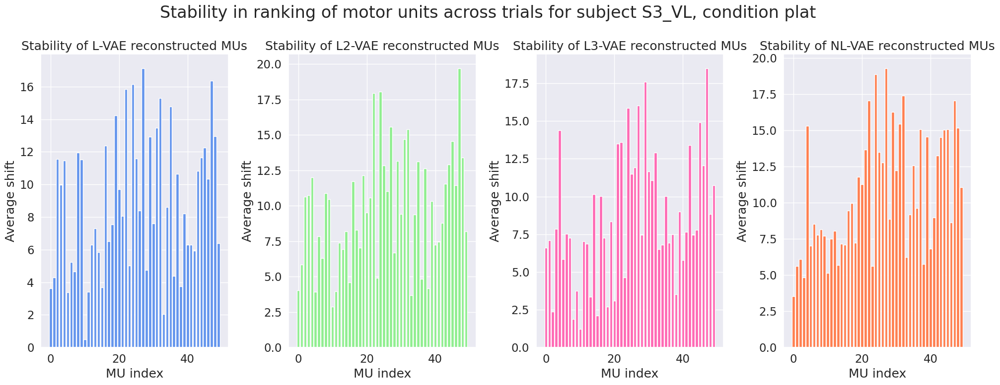


S3_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 27 (0.50)  | 48 (2.86)  |  2 (1.22)  | 45 (3.54)  |  0 (5.89)  |
| 22 (2.05)  | 27 (3.67)  |  6 (1.87)  | 42 (4.85)  |  1 (3.91)  |
| 12 (3.39)  | 14 (3.94)  | 13 (2.12)  | 34 (5.15)  | 2 (17.68)  |
| 48 (3.42)  | 39 (3.96)  | 40 (2.38)  | 27 (5.61)  | 3 (14.25)  |
| 39 (3.63)  | 31 (4.03)  | 47 (2.69)  | 41 (5.63)  |  4 (6.67)  |
| 41 (3.67)  | 45 (4.18)  | 39 (3.08)  |  0 (5.67)  |  5 (6.36)  |
|  3 (3.74)  | 34 (4.60)  | 27 (3.34)  | 22 (5.76)  |  6 (7.89)  |
| 45 (4.30)  |  3 (4.82)  |  8 (3.54)  | 47 (6.10)  |  7 (9.91)  |
| 37 (4.38)  | 41 (4.90)  | 19 (3.77)  |  8 (6.22)  | 8 (14.78)  |
| 17 (4.66)  | 12 (5.85)  | 34 (4.64)  | 39 (6.82)  | 9 (11.34)  |
|  7 (4.76)  | 17 (6.30)  | 32 (5.79)  | 32 (7.02)  | 10 (16.53) |
|  9 (5.02)  | 42 (6.69)  | 48 (5.85)  | 14 (7.0

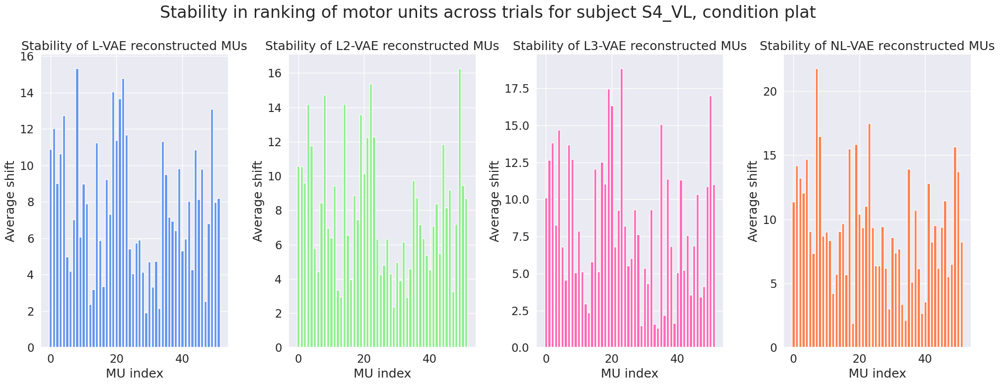


S4_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
|  4 (1.92)  | 16 (2.38)  | 36 (1.30)  | 25 (1.92)  |  0 (4.42)  |
| 40 (2.17)  |  4 (2.92)  | 25 (1.48)  | 47 (2.12)  | 1 (13.69)  |
| 16 (2.38)  | 43 (2.96)  | 40 (1.58)  | 13 (2.68)  |  2 (1.58)  |
| 51 (2.55)  | 51 (3.28)  |  4 (1.66)  | 22 (3.03)  |  3 (8.41)  |
| 30 (3.20)  | 30 (3.34)  |  5 (2.18)  | 27 (3.39)  |  4 (6.87)  |
| 43 (3.32)  | 12 (3.90)  | 28 (2.35)  |  1 (3.57)  |  5 (8.56)  |
| 10 (3.34)  | 23 (3.96)  |  1 (2.95)  | 12 (4.21)  |  6 (7.73)  |
| 49 (4.06)  | 40 (4.24)  | 46 (3.42)  | 49 (5.12)  |  7 (7.40)  |
| 12 (4.15)  |  7 (4.32)  | 30 (3.56)  |  9 (5.54)  | 8 (12.34)  |
| 25 (4.21)  | 44 (4.42)  | 33 (4.12)  | 31 (5.70)  | 9 (12.21)  |
| 23 (4.27)  | 25 (4.55)  | 51 (4.33)  |  6 (5.72)  | 10 (10.92) |
| 24 (4.72)  | 49 (4.61)  |  6 (4.56)  |  5 (6.1

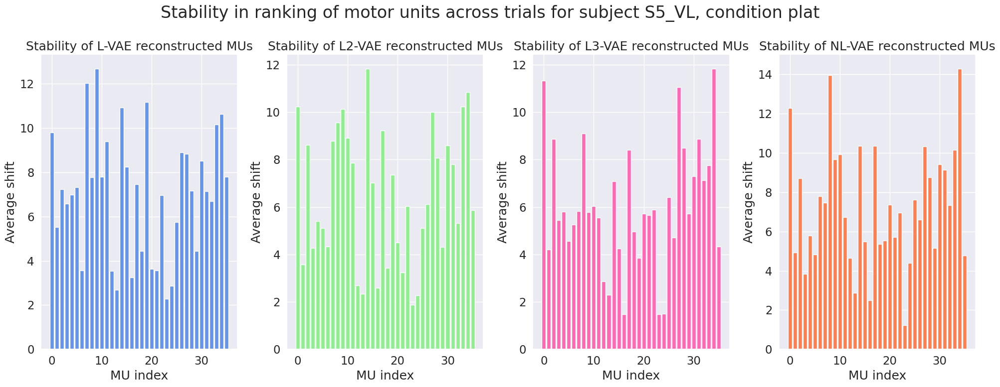


S5_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
|  0 (2.28)  | 31 (1.87)  |  1 (1.48)  |  1 (1.22)  | 0 (13.61)  |
| 23 (2.69)  |  1 (2.28)  | 19 (1.48)  |  8 (2.49)  |  1 (1.64)  |
| 32 (2.86)  |  8 (2.35)  |  8 (1.50)  | 31 (2.87)  |  2 (1.48)  |
| 18 (3.24)  | 23 (2.59)  | 26 (2.29)  |  5 (3.84)  |  3 (8.90)  |
|  1 (3.54)  |  0 (2.69)  | 27 (2.86)  | 27 (4.39)  |  4 (7.65)  |
| 27 (3.56)  | 32 (3.24)  | 23 (3.84)  |  2 (4.64)  |  5 (6.54)  |
| 16 (3.57)  | 27 (3.42)  | 15 (4.21)  | 28 (4.76)  |  6 (3.34)  |
|  8 (3.64)  |  2 (3.57)  | 31 (4.24)  | 35 (4.82)  |  7 (2.49)  |
|  2 (4.44)  | 22 (4.27)  | 21 (4.32)  | 26 (4.92)  |  8 (2.35)  |
| 24 (4.44)  |  5 (4.30)  |  2 (4.56)  |  3 (5.17)  |  9 (3.63)  |
| 15 (5.52)  | 35 (4.33)  | 35 (4.72)  | 23 (5.36)  | 10 (2.92)  |
| 28 (5.74)  | 16 (4.49)  | 28 (4.97)  | 24 (5.4

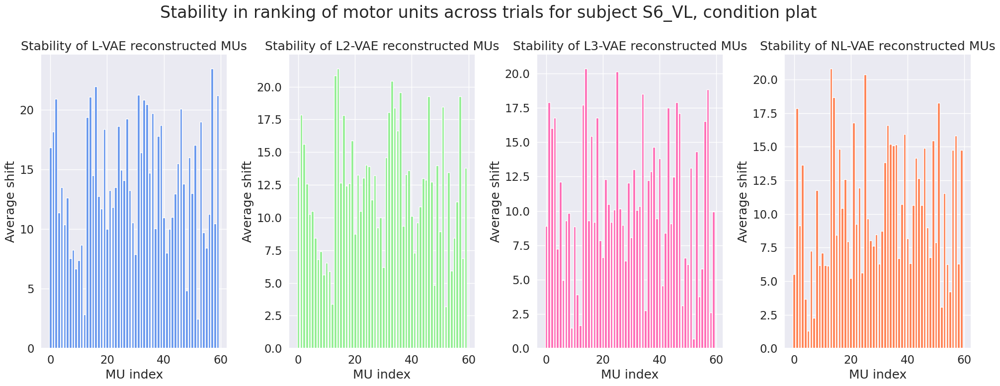


S6_VL, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 19 (2.49)  | 35 (3.20)  |  9 (0.71)  | 13 (1.30)  | 0 (15.38)  |
| 43 (2.86)  | 49 (3.39)  | 12 (1.48)  | 35 (2.28)  | 1 (11.80)  |
| 49 (4.85)  |  3 (4.82)  | 52 (1.66)  | 24 (3.08)  | 2 (14.08)  |
| 32 (6.69)  | 18 (5.63)  | 13 (2.60)  |  0 (3.67)  | 3 (14.12)  |
| 36 (7.40)  | 43 (5.89)  | 14 (2.74)  | 46 (4.21)  | 4 (13.96)  |
| 35 (7.56)  | 23 (5.93)  | 23 (3.11)  | 58 (5.21)  |  5 (8.87)  |
| 38 (7.91)  | 17 (6.18)  | 57 (3.77)  | 11 (5.52)  |  6 (5.61)  |
| 37 (8.02)  | 57 (6.53)  | 38 (3.90)  |  9 (5.61)  | 7 (14.04)  |
| 23 (8.26)  | 38 (6.80)  | 37 (4.55)  | 52 (6.14)  |  8 (6.58)  |
| 21 (8.44)  | 47 (6.87)  | 11 (4.97)  | 14 (6.18)  | 9 (22.99)  |
|  8 (8.70)  | 44 (7.31)  | 54 (5.80)  | 27 (6.18)  | 10 (2.59)  |
| 44 (9.73)  | 27 (7.40)  | 29 (6.10)  | 21 (6.2

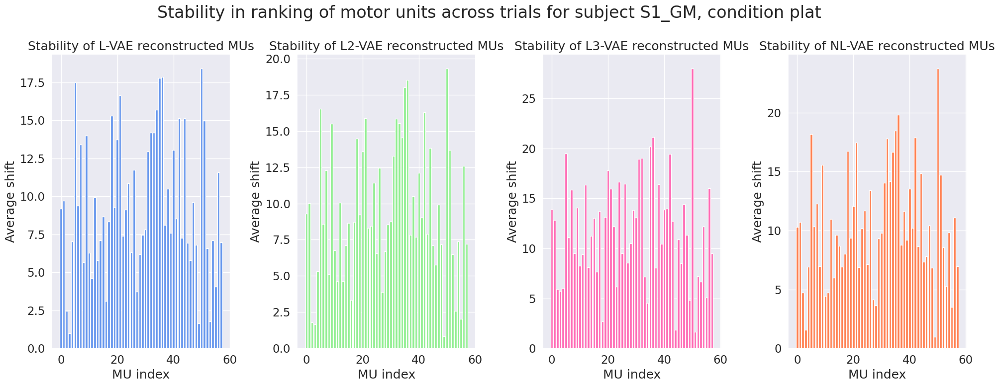


S1_GM, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 35 (1.00)  | 35 (0.83)  | 56 (1.64)  | 35 (1.00)  |  0 (4.15)  |
| 50 (1.64)  | 50 (1.64)  | 35 (1.87)  | 50 (1.58)  |  1 (7.98)  |
| 56 (1.79)  | 11 (1.79)  | 26 (2.69)  | 26 (3.49)  |  2 (4.58)  |
| 15 (2.45)  | 40 (2.05)  | 36 (4.55)  | 44 (3.64)  |  3 (8.56)  |
| 36 (3.11)  | 15 (2.59)  | 40 (4.85)  | 36 (4.12)  |  4 (9.51)  |
| 37 (3.74)  | 56 (3.34)  | 15 (5.07)  | 25 (4.44)  |  5 (4.09)  |
| 51 (4.06)  | 36 (3.90)  | 38 (5.72)  | 56 (4.71)  |  6 (9.63)  |
| 26 (4.60)  | 26 (4.64)  |  3 (5.93)  | 40 (4.74)  |  7 (7.60)  |
| 53 (5.67)  | 44 (4.64)  | 13 (6.02)  | 49 (5.26)  |  8 (7.01)  |
| 40 (5.79)  | 45 (5.12)  | 27 (6.16)  |  4 (6.02)  |  9 (8.58)  |
| 44 (5.79)  |  3 (5.32)  | 53 (6.69)  | 53 (6.83)  | 10 (6.18)  |
| 41 (6.18)  | 53 (5.76)  | 39 (7.16)  |  1 (6.8

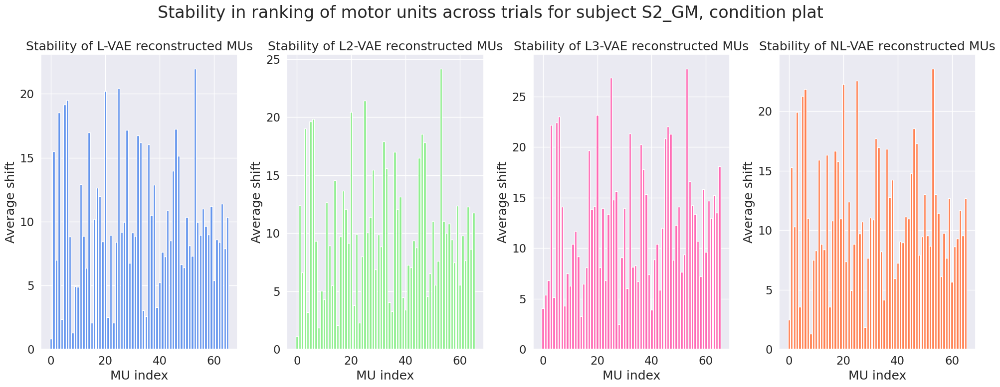


S2_GM, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 25 (0.83)  | 25 (1.12)  | 54 (2.49)  | 25 (1.30)  |  0 (6.04)  |
|  6 (1.30)  |  3 (1.87)  | 32 (3.27)  |  3 (1.87)  | 1 (17.30)  |
|  3 (2.06)  |  0 (2.06)  |  2 (3.90)  | 14 (2.49)  | 2 (14.10)  |
| 20 (2.06)  | 28 (2.29)  | 61 (4.03)  | 32 (3.56)  | 3 (23.67)  |
| 14 (2.35)  | 16 (3.20)  | 26 (4.32)  | 40 (3.56)  |  4 (5.02)  |
|  1 (2.50)  | 40 (3.27)  | 14 (5.12)  |  0 (4.15)  |  5 (1.87)  |
| 15 (2.59)  | 15 (3.39)  | 15 (5.36)  | 54 (4.95)  | 6 (24.48)  |
|  0 (3.04)  | 14 (3.77)  | 40 (5.87)  | 19 (5.68)  |  7 (5.43)  |
| 28 (3.27)  |  6 (4.06)  | 59 (6.02)  |  4 (5.94)  | 8 (14.33)  |
| 26 (4.90)  | 26 (4.32)  | 51 (6.26)  |  8 (6.14)  |  9 (3.20)  |
| 59 (4.92)  | 20 (4.47)  | 48 (6.46)  | 59 (7.25)  | 10 (7.29)  |
| 40 (5.22)  | 59 (4.56)  | 23 (6.71)  | 15 (7.4

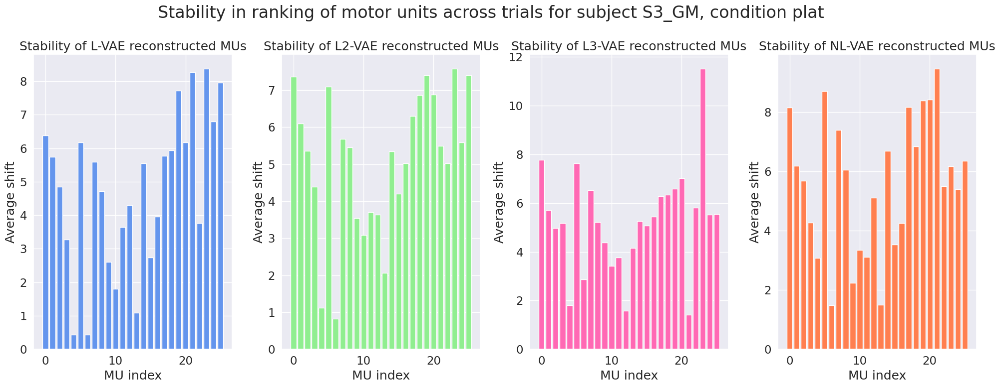


S3_GM, plat:
+-----------+-----------+-----------+-----------+-----------+
|   L-VAE   |   L2-VAE  |   L3-VAE  |   NL-VAE  | Stability |
+-----------+-----------+-----------+-----------+-----------+
|  4 (0.43) |  6 (0.83) |  8 (1.41) |  6 (1.48) | 0 (10.14) |
|  6 (0.43) |  0 (1.12) |  6 (1.58) |  0 (1.50) |  1 (6.06) |
| 22 (1.09) |  4 (2.06) | 12 (1.80) | 12 (2.24) |  2 (8.41) |
|  0 (1.80) |  8 (3.08) |  2 (2.86) |  8 (3.08) |  3 (5.12) |
| 21 (2.60) | 18 (3.54) |  1 (3.42) | 23 (3.11) |  4 (2.38) |
| 17 (2.74) | 22 (3.63) | 23 (3.77) |  4 (3.34) |  5 (4.72) |
|  8 (3.28) | 12 (3.70) |  4 (4.15) | 14 (3.54) |  6 (0.50) |
| 18 (3.64) | 21 (4.21) | 13 (4.38) | 24 (4.24) |  7 (1.73) |
| 11 (3.77) |  5 (4.39) | 14 (4.97) | 25 (4.26) |  8 (2.12) |
| 12 (3.96) | 11 (5.02) | 21 (5.07) | 16 (5.10) |  9 (4.97) |
| 14 (4.30) | 23 (5.02) | 24 (5.17) | 22 (5.39) | 10 (3.24) |
| 23 (4.72) |  1 (5.34) |  3 (5.22) |  1 (5.50) | 11 (2.77) |
| 20 (4.85) | 14 (5.36) |  9 (5.26) |  3 (5.68) | 12 (2.

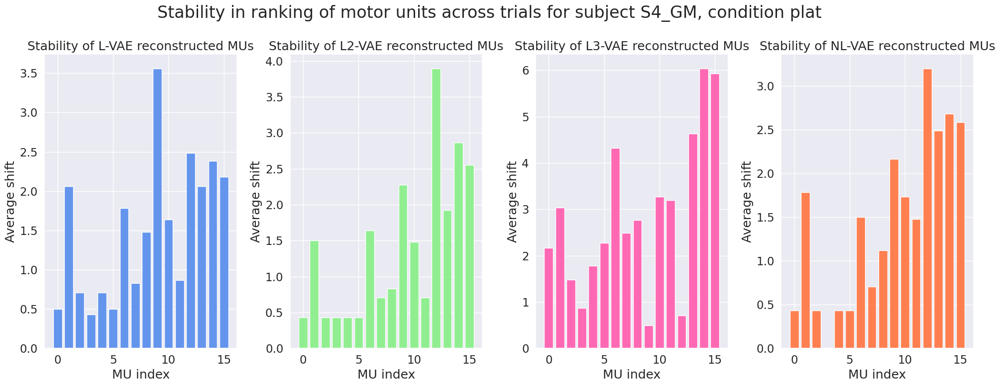


S4_GM, plat:
+-----------+-----------+-----------+-----------+-----------+
|   L-VAE   |   L2-VAE  |   L3-VAE  |   NL-VAE  | Stability |
+-----------+-----------+-----------+-----------+-----------+
| 10 (0.43) |  9 (0.43) | 10 (0.50) | 10 (0.00) |  0 (2.86) |
| 13 (0.50) | 10 (0.43) |  2 (0.71) |  9 (0.43) |  1 (1.48) |
| 15 (0.50) | 13 (0.43) | 13 (0.87) | 12 (0.43) |  2 (2.59) |
|  2 (0.71) | 14 (0.43) |  7 (1.48) | 14 (0.43) |  3 (2.35) |
| 14 (0.71) | 15 (0.43) |  5 (1.79) | 15 (0.43) |  4 (2.05) |
| 12 (0.83) |  2 (0.71) |  1 (2.17) | 13 (0.71) |  5 (3.42) |
|  1 (0.87) | 12 (0.71) |  8 (2.28) |  8 (1.12) |  6 (2.17) |
| 11 (1.48) |  1 (0.83) |  4 (2.49) |  0 (1.48) |  7 (2.95) |
|  7 (1.64) |  8 (1.48) |  3 (2.77) |  2 (1.50) |  8 (2.45) |
|  9 (1.79) |  7 (1.50) | 15 (3.03) |  1 (1.73) |  9 (5.45) |
|  4 (2.06) | 11 (1.64) |  6 (3.20) | 11 (1.79) | 10 (0.43) |
|  5 (2.06) |  5 (1.92) | 11 (3.27) |  7 (2.17) | 11 (1.50) |
|  8 (2.18) |  4 (2.28) |  0 (4.32) |  4 (2.49) | 12 (4.

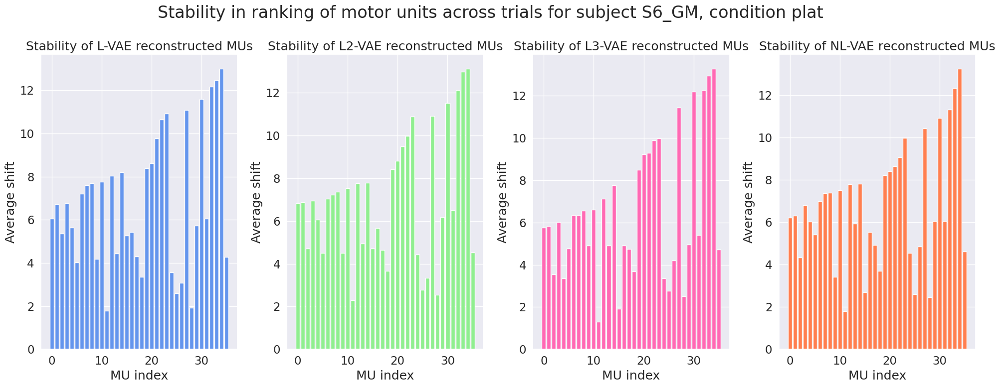


S6_GM, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 24 (1.79)  |  3 (2.28)  |  4 (1.30)  | 26 (1.80)  |  0 (2.29)  |
| 23 (1.92)  | 24 (2.55)  |  3 (1.92)  | 24 (2.45)  |  1 (3.27)  |
| 14 (2.59)  | 26 (2.77)  | 14 (2.50)  | 19 (2.59)  |  2 (0.83)  |
| 26 (3.08)  | 28 (3.34)  | 26 (2.77)  |  6 (2.69)  |  3 (2.86)  |
| 16 (3.34)  | 14 (3.67)  | 18 (3.34)  | 14 (3.42)  |  4 (3.84)  |
|  3 (3.57)  | 16 (4.44)  | 19 (3.34)  | 11 (3.70)  |  5 (4.76)  |
| 19 (4.02)  |  5 (4.50)  |  8 (3.54)  | 33 (4.32)  |  6 (6.65)  |
| 28 (4.18)  | 11 (4.50)  | 28 (3.67)  |  3 (4.55)  |  7 (1.87)  |
|  4 (4.27)  | 19 (4.53)  | 11 (4.21)  |  4 (4.61)  |  8 (8.03)  |
| 17 (4.30)  | 25 (4.64)  | 24 (4.71)  | 28 (4.85)  |  9 (8.75)  |
|  5 (4.44)  |  4 (4.71)  | 10 (4.74)  |  5 (4.92)  | 10 (5.94)  |
| 11 (5.26)  | 23 (4.72)  |  9 (4.77)  | 10 (5.4

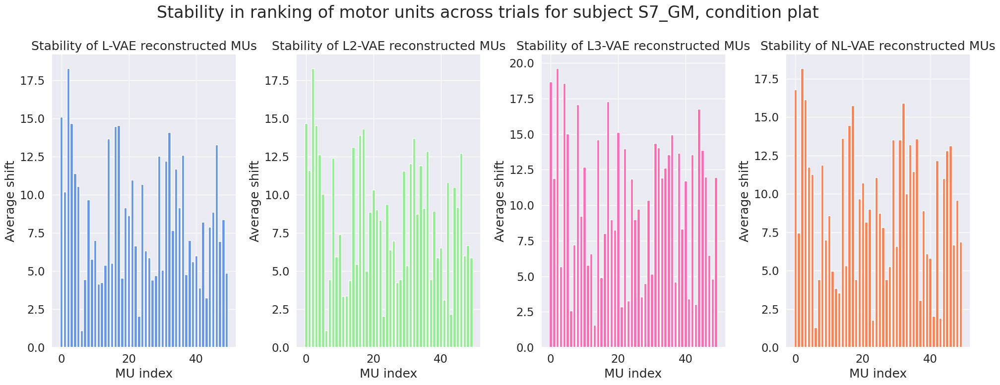


S7_GM, plat:
+------------+------------+------------+------------+------------+
|   L-VAE    |   L2-VAE   |   L3-VAE   |   NL-VAE   | Stability  |
+------------+------------+------------+------------+------------+
| 16 (1.12)  | 16 (1.12)  | 40 (1.58)  | 16 (1.30)  |  0 (6.42)  |
| 14 (2.05)  | 14 (2.05)  | 14 (2.59)  | 27 (1.79)  |  1 (6.91)  |
|  5 (3.24)  | 13 (2.18)  | 13 (2.87)  | 13 (1.92)  |  2 (0.71)  |
| 44 (3.91)  | 39 (3.11)  | 39 (3.03)  | 14 (2.05)  | 3 (12.14)  |
| 39 (4.15)  | 44 (3.34)  | 45 (3.27)  | 26 (3.08)  | 4 (14.15)  |
| 30 (4.27)  |  8 (3.39)  | 30 (3.42)  | 39 (3.57)  | 5 (15.94)  |
|  2 (4.42)  | 45 (4.24)  | 27 (3.56)  |  8 (3.83)  |  6 (1.73)  |
|  3 (4.44)  | 30 (4.39)  |  2 (4.50)  |  2 (4.42)  |  7 (7.15)  |
|  8 (4.56)  |  2 (4.44)  | 18 (4.60)  |  3 (4.44)  | 8 (14.62)  |
| 42 (4.72)  |  3 (4.44)  | 42 (4.82)  | 44 (4.44)  |  9 (2.24)  |
| 13 (4.76)  |  5 (4.44)  |  7 (4.92)  | 45 (4.97)  | 10 (3.77)  |
| 26 (4.87)  | 26 (5.02)  | 47 (5.15)  | 20 (5.2

In [ ]:
# Trials
for i in range(len(subjects)):
    for j in range(1):#len(conditions)):
        trial_rankings_l = []
        trial_rankings_l2 = []
        trial_rankings_l3 = []
        trial_rankings_nl = []

        for k in range(n_trials):
            names_l, _, _ = zip(*lin[i][j][k])
            names_nl, _, _ = zip(*nlin[i][j][k])
            names_l2, _, _ = zip(*lin2[i][j][k])
            names_l3, _, _ = zip(*lin3[i][j][k])

            trial_rankings_l.append(names_l)
            trial_rankings_nl.append(names_nl)
            trial_rankings_l2.append(names_l2)
            trial_rankings_l3.append(names_l3)

        # get rankings as neurons by trials
        trans_rankings_l = []
        trans_rankings_l2 = []
        trans_rankings_l3 = []
        trans_rankings_nl = []

        # Linear
        for ind in range(len(trial_rankings_l[0])):
            # Find the row index number associated with the MU index for each model
            index_trial_1 = np.where(np.array(trial_rankings_l[0]) == ind)[0][0]
            index_trial_2 = np.where(np.array(trial_rankings_l[1]) == ind)[0][0]
            index_trial_3 = np.where(np.array(trial_rankings_l[2]) == ind)[0][0]
            cur_model_ind = [index_trial_1, index_trial_2, index_trial_3]
            if n_trials == 4:
                cur_model_ind.append(np.where(np.array(trial_rankings_l[3]) == ind)[0][0])
            trans_rankings_l.append(np.std(cur_model_ind))

        # Linear 2 D
        for ind in range(len(trial_rankings_l2[0])):
            # Find the row index number associated with the MU index for each model
            index_trial_1 = np.where(np.array(trial_rankings_l2[0]) == ind)[0][0]
            index_trial_2 = np.where(np.array(trial_rankings_l2[1]) == ind)[0][0]
            index_trial_3 = np.where(np.array(trial_rankings_l2[2]) == ind)[0][0]
            cur_model_ind = [index_trial_1, index_trial_2, index_trial_3]
            if n_trials == 4:
                cur_model_ind.append(np.where(np.array(trial_rankings_l2[3]) == ind)[0][0])
            trans_rankings_l2.append(np.std(cur_model_ind))

        # Linear 3 D
        for ind in range(len(trial_rankings_l3[0])):
            # Find the row index number associated with the MU index for each model
            index_trial_1 = np.where(np.array(trial_rankings_l3[0]) == ind)[0][0]
            index_trial_2 = np.where(np.array(trial_rankings_l3[1]) == ind)[0][0]
            index_trial_3 = np.where(np.array(trial_rankings_l3[2]) == ind)[0][0]
            cur_model_ind = [index_trial_1, index_trial_2, index_trial_3]
            if n_trials == 4:
                cur_model_ind.append(np.where(np.array(trial_rankings_l3[3]) == ind)[0][0])
            trans_rankings_l3.append(np.std(cur_model_ind))

        # Non Linear
        for ind in range(len(trial_rankings_nl[0])):
            # Find the row index number associated with the MU index for each model
            index_trial_1 = np.where(np.array(trial_rankings_nl[0]) == ind)[0][0]
            index_trial_2 = np.where(np.array(trial_rankings_nl[1]) == ind)[0][0]
            index_trial_3 = np.where(np.array(trial_rankings_nl[2]) == ind)[0][0]
            cur_model_ind = [index_trial_1, index_trial_2, index_trial_3]
            if n_trials == 4:
                cur_model_ind.append(np.where(np.array(trial_rankings_nl[3]) == ind)[0][0])
            trans_rankings_nl.append(np.std(cur_model_ind))

        # get rankings as neurons by trials
        m_scores_l = np.transpose(trans_rankings_l)
        m_scores_l2 = np.transpose(trans_rankings_l2)
        m_scores_l3 = np.transpose(trans_rankings_l3)
        m_scores_nl = np.transpose(trans_rankings_nl)

        MU_scores_l = list(enumerate(m_scores_l))
        MU_scores_l2 = list(enumerate(m_scores_l2))
        MU_scores_l3 = list(enumerate(m_scores_l3))
        MU_scores_nl = list(enumerate(m_scores_nl))

        MU_scores_l.sort(key=lambda x: x[1])
        MU_scores_l2.sort(key=lambda x: x[1])
        MU_scores_l3.sort(key=lambda x: x[1])
        MU_scores_nl.sort(key=lambda x: x[1])

        final_ranking_l = [MU_index for MU_index, _ in MU_scores_l]
        final_ranking_l2 = [MU_index for MU_index, _ in MU_scores_l2]
        final_ranking_l3 = [MU_index for MU_index, _ in MU_scores_l3]
        final_ranking_nl = [MU_index for MU_index, _ in MU_scores_nl]

        # Create a PrettyTable object
        table = PrettyTable()

        # Define column names for PrettyTable
        table.field_names = ["L-VAE", "L2-VAE", "L3-VAE", "NL-VAE", "Stability"]

        # Create a pandas DataFrame to store neuron indices and scores
        df = pd.DataFrame()

        # Extract neuron indices and scores for each model
        MU_indices_l, scores_l = zip(*MU_scores_l)
        MU_indices_l2, scores_l2 = zip(*MU_scores_l2)
        MU_indices_l3, scores_l3 = zip(*MU_scores_l3)
        MU_indices_nl, scores_nl = zip(*MU_scores_nl)

        # Add rows to the DataFrame
        df["Position"] = range(1, len(MU_indices_l) + 1)
        df["L-VAE"] = MU_indices_l
        df["L2-VAE"] = MU_indices_l2
        df["L3-VAE"] = MU_indices_l3
        df["NL-VAE"] = MU_indices_nl

        # Create the Stability column
        stability_scores = []
        for ind in range(len(MU_indices_l)):
            # Find the row index number associated with the MU index for each model
            index_model_l = np.where(np.array(MU_indices_l) == ind)[0][0]
            index_model_l2 = np.where(np.array(MU_indices_l2) == ind)[0][0]
            index_model_l3 = np.where(np.array(MU_indices_l3) == ind)[0][0]
            index_model_nl = np.where(np.array(MU_indices_nl) == ind)[0][0]
            stability_scores.append(np.std([index_model_l,index_model_l2,index_model_l3,index_model_nl]))

        df["Stability"] = stability_scores

        # Set the index of the DataFrame to the "Position" column
        df.set_index("Position", inplace=True)

        # Add rows to the PrettyTable
        for position, row in df.iterrows():
            table.add_row([f"{int(row['L-VAE'])} ({scores_l[position-1]:.2f})",
                           f"{int(row['L2-VAE'])} ({scores_l2[position-1]:.2f})",
                           f"{int(row['L3-VAE'])} ({scores_l3[position-1]:.2f})",
                           f"{int(row['NL-VAE'])} ({scores_nl[position-1]:.2f})",
                           f"{position-1} ({row['Stability']:.2f})"])

        # Create bar charts for each result list
        plt.figure(figsize=(20, 8))

        plt.subplot(1, 4, 1)
        plt.bar(names_l, scores_l, capsize=5, color='cornflowerblue')
        plt.title(f'Stability of L-VAE reconstructed MUs')
        plt.xlabel('MU index')
        plt.ylabel('Average shift')

        plt.subplot(1, 4, 2)
        plt.bar(names_l2, scores_l2, capsize=5, color='lightgreen')
        plt.title(f'Stability of L2-VAE reconstructed MUs')
        plt.xlabel('MU index')
        plt.ylabel('Average shift')

        plt.subplot(1, 4, 3)
        plt.bar(names_l3, scores_l3, capsize=5, color='hotpink')
        plt.title(f'Stability of L3-VAE reconstructed MUs')
        plt.xlabel('MU index')
        plt.ylabel('Average shift')

        plt.subplot(1, 4, 4)
        plt.bar(names_nl, scores_nl, capsize=5, color='coral')
        plt.title(f'Stability of NL-VAE reconstructed MUs')
        plt.xlabel('MU index')
        plt.ylabel('Average shift')

        plt.suptitle(f'Stability in ranking of motor units across trials for subject {subjects[i]}, condition {conditions[j]}', fontsize=24)
        # Show the plots
        plt.tight_layout()
        plt.show()

        # Print the PrettyTable
        print(f"\n{subjects[i]}, {conditions[j]}:")
        print(table)

In [ ]:
def find_mus_by_trial(model, mu):
  t1 = [tup for tup in model[0][0][0] if tup[0] == mu]
  t2 = [tup for tup in model[0][0][1] if tup[0] == mu]
  t3 = [tup for tup in model[0][0][2] if tup[0] == mu]
  t4 = [tup for tup in model[0][0][3] if tup[0] == mu]

  print("The requested motor unit was reconstructed with the following accuracies per trial: \n")
  print(f"Trial 1: {t1}, Trial 2: {t2}, Trial 3: {t3}, Trial 4: {t4}")

In [ ]:
# MU to find
mu = 20

find_mus_by_trial(lin, mu)

The requested motor unit was reconstructed with the following accuracies per trial: 

Trial 1: [(20, 0.07818389055232064, 0.002205202722097154)], Trial 2: [(20, 0.16971060940531665, 0.004540770564789806)], Trial 3: [(20, 0.5712357942557488, 0.0033117046618348803)], Trial 4: [(20, 0.24054661141410122, 0.005425371126573328)]


### Recruitment Threshold

Now that we know we do not have a lot of consistency between how a motor units can be reconstructed between trials, it may still be interesting how this relates to the recruitment threshold.
To visualise this we want to order the MUs across subject by recruitment threshold for every trial.

In [ ]:
# Load recruitment thresholds per subject
S1_VL_RT = pd.read_csv(path+'RT_Out/S1_VL_RT_MUs.csv', header=None)
S2_VL_RT = pd.read_csv(path+'RT_Out/S2_VL_RT_MUs.csv', header=None)
S3_VL_RT = pd.read_csv(path+'RT_Out/S3_VL_RT_MUs.csv', header=None)
S4_VL_RT = pd.read_csv(path+'RT_Out/S4_VL_RT_MUs.csv', header=None)
S5_VL_RT = pd.read_csv(path+'RT_Out/S5_VL_RT_MUs.csv', header=None)
S6_VL_RT = pd.read_csv(path+'RT_Out/S6_VL_RT_MUs.csv', header=None)
S1_GM_RT = pd.read_csv(path+'RT_Out/S1_GM_RT_MUs.csv', header=None)
S2_GM_RT = pd.read_csv(path+'RT_Out/S2_GM_RT_MUs.csv', header=None)
S3_GM_RT = pd.read_csv(path+'RT_Out/S3_GM_RT_MUs.csv', header=None)
S4_GM_RT = pd.read_csv(path+'RT_Out/S4_GM_RT_MUs.csv', header=None)
S6_GM_RT = pd.read_csv(path+'RT_Out/S6_GM_RT_MUs.csv', header=None)
S7_GM_RT = pd.read_csv(path+'RT_Out/S7_GM_RT_MUs.csv', header=None)
RT = [S1_VL_RT, S2_VL_RT, S3_VL_RT, S4_VL_RT, S5_VL_RT, S6_VL_RT, S1_GM_RT, S2_GM_RT, S3_GM_RT, S4_GM_RT, S6_GM_RT, S7_GM_RT]

In [ ]:
# Function to append recruitment thresholds to results
def append_RT(model, th=0):
  rt_l = []
  for i in range(len(subjects)-6+th):
    set_subjects_l = []
    for j in range(1):#len(conditions)):
      set_trials_l = []
      for k in range(n_trials):
        # Retrieve tuples for current trials
        index_l, scores_l, std_l = zip(*model[i][j][k])
        new_ind_l = tuple(elem + 1 for elem in index_l)
        cur_l = list(zip(new_ind_l, scores_l, std_l))

        # Retrieve recruitment threshold for current subject
        rt = RT[i]

        # Map index to values
        rt_tuples = dict(zip(rt[0], rt[1]))

        # Update tuple values
        updated_l = [(idx, tup[1], tup[2], rt_tuples.get(idx, 0)) for idx, tup in zip(rt[0], cur_l)]

        set_trials_l.append(updated_l)
      set_subjects_l.append(set_trials_l)
    rt_l.append(set_subjects_l)
  return rt_l

In [ ]:
def split_trials(model, th=0):
  t1 = []
  t2 = []
  t3 = []
  t4 = []
  for i in range(len(subjects)-6+th):
    for j in range(1):
      for k in range(n_trials):
        if k == 0:
          t1.append(model[i][j][k])
        elif k == 1:
          t2.append(model[i][j][k])
        elif k == 2:
          t3.append(model[i][j][k])
        else:
          t4.append(model[i][j][k])
  return t1, t2, t3, t4

In [ ]:
def extrap_to_trial(trial):
  cnt = 0
  out = []
  for subject in trial:
    for tup in subject:
      # Construct the tuple with the incremented index counter and the remaining values
      new_tuple = (cnt, *tup[1:])
      out.append(new_tuple)
      cnt += 1
  return out

In [ ]:
def order_by_RT(model, th=0):
  rt = append_RT(model, th)
  rt1, rt2, rt3, rt4 = split_trials(rt, th)
  t1 = extrap_to_trial(rt1)
  t1 = [tup for tup in t1 if not any(math.isinf(val) or math.isnan(val) for val in tup)]
  t1 = sorted(t1, key=lambda x: x[3], reverse=True)

  t2 = extrap_to_trial(rt2)
  t2 = [tup for tup in t2 if not any(math.isinf(val) or math.isnan(val) for val in tup)]
  t2 = sorted(t2, key=lambda x: x[3], reverse=True)

  t3 = extrap_to_trial(rt3)
  t3 = [tup for tup in t3 if not any(math.isinf(val) or math.isnan(val) for val in tup)]
  t3 = sorted(t3, key=lambda x: x[3], reverse=True)

  t4 = extrap_to_trial(rt4)
  t4 = [tup for tup in t4 if not any(math.isinf(val) or math.isnan(val) for val in tup)]
  t4 = sorted(t4, key=lambda x: x[3], reverse=True)

  return [t1, t2, t3, t4]

In [ ]:
def get_poly(trial, order):
  rts = [tup[3] for tup in trial]
  r2s = [tup[1] for tup in trial]

  # Fit a second-order polynomial to the data
  coeff = np.polyfit(rts, r2s, order)

  # Create a polynomial function based on the fitted coefficients
  function = np.poly1d(coeff)

  # Generate x values for the plot
  x = np.linspace(min(rts), max(rts), 100)

  # Evaluate the polynomial function at the generated x values
  y = function(x)

  return [x, y]

In [ ]:
th = 6 # 0 = VL only, 6 = GM only, -6 = both
rt_l = order_by_RT(lin, th)
rt_l2 = order_by_RT(lin2, th)
rt_l3 = order_by_RT(lin3, th)
rt_nl = order_by_RT(nlin, th)

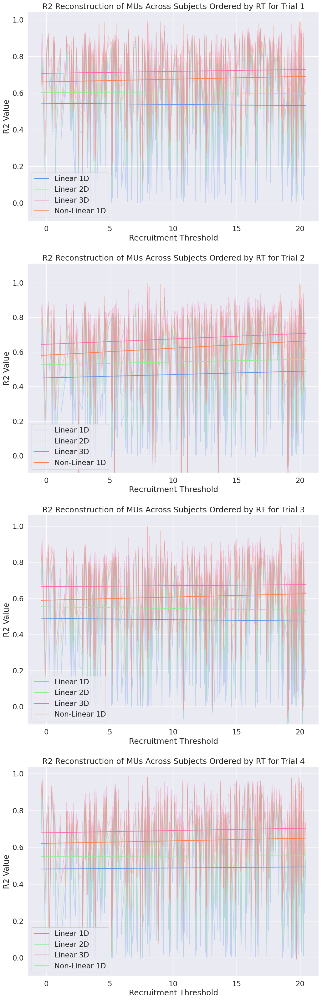

In [ ]:
# Create bar charts for each result list
plt.figure(figsize=(12, 40))
for i in range(len(rt_l)):
  trial_rt_l = rt_l[i]
  trial_rt_l2 = rt_l2[i]
  trial_rt_l3 = rt_l3[i]
  trial_rt_nl = rt_nl[i]

  poly_trial_l = get_poly(trial_rt_l, 1)
  poly_trial_l2 = get_poly(trial_rt_l2, 1)
  poly_trial_l3 = get_poly(trial_rt_l3, 1)
  poly_trial_nl = get_poly(trial_rt_nl, 1)

  plt.subplot(4, 1, i+1)
  plt.plot([tup[3] for tup in trial_rt_l], [tup[1] for tup in trial_rt_l], color='cornflowerblue', alpha=0.3)
  plt.plot([tup[3] for tup in trial_rt_l2], [tup[1] for tup in trial_rt_l2], color='lightgreen', alpha=0.3)
  plt.plot([tup[3] for tup in trial_rt_l3], [tup[1] for tup in trial_rt_l3], color='hotpink', alpha=0.3)
  plt.plot([tup[3] for tup in trial_rt_nl], [tup[1] for tup in trial_rt_nl], color='coral', alpha=0.3)

  plt.plot(poly_trial_l[0], poly_trial_l[1], color='cornflowerblue', label='Linear 1D')
  plt.plot(poly_trial_l2[0], poly_trial_l2[1], color='lightgreen', label='Linear 2D')
  plt.plot(poly_trial_l3[0], poly_trial_l3[1], color='hotpink', label='Linear 3D')
  plt.plot(poly_trial_nl[0], poly_trial_nl[1], color='coral', label='Non-Linear 1D')
  plt.title(f'R2 Reconstruction of MUs Across Subjects Ordered by RT for Trial {i+1}')
  plt.xlabel('Recruitment Threshold')
  plt.ylabel('R2 Value')
  plt.legend()
  plt.ylim(bottom=-0.1)
